<a href="https://colab.research.google.com/github/adasegroup/ML2023_seminars/blob/master/seminar8/Multiclass_Imbalanced_solutions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-class cases and  Imbalanced data problem

#####*Diana Koldasbayeva*

### **Plan:**🧐

##### **1️ Introduction to multiclassification**

##### **2️ Multiclass classification**
- Multinomial Logistic Regression
- Decision Tree for multiclass
- Strategies: *One-vs-Rest (OvR) and One-vs-One (OvO)*
  - Concept, strengths and weaknesses
- *Comparison of Multiclass Strategies*
  - Performance on balanced vs. imbalanced datasets

##### **3️ The imbalanced classification problem**
- *Challenges of imbalanced data*
  - Biased learning and poor generalization
  - Misleading evaluation using accuracy
- *Handling Imbalance*
  - Sampling techniques
  - Algorithm-level solutions
  - Ensemble methods
  - Evaluation metrics for imbalanced Data






##Intro

Classification is broadly distinguished into:


*   **Binary classification**

Binary classification involves a dataset with only two class instances.
It requires only one classifier model.
Confusion Matrix is easy to derive and understand.
In a binary classification problem, you might predict whether an animal is Dog or Cat.


*   **Multiclass classification**

Multiclass classification involves datasets with multiple class labels.
The number of classifier models depends on the chosen classification technique.
One vs. All: If N-class instances then N binary classifier models
One vs. One: If N-class instances then N * (N-1)/2 binary classifier models





<img src="https://miro.medium.com/v2/resize:fit:1100/format:webp/0*AT1W9oWnZUKp15ym.jpeg" width="600">

In [ ]:
# Standard library imports
import time
from itertools import combinations

# Third-party library imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Scikit-learn imports
import sklearn
from sklearn import metrics, datasets, linear_model
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score,  f1_score,
    log_loss,  roc_auc_score, average_precision_score,
    classification_report, confusion_matrix, make_scorer
)
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.datasets import make_moons, make_circles
from sklearn.model_selection import (
    train_test_split, cross_val_predict, cross_val_score, RepeatedStratifiedKFold
)
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.datasets import make_classification
from sklearn.cluster import MiniBatchKMeans
from sklearn.model_selection import StratifiedKFold, cross_validate

# Imbalanced-learn imports
import imblearn
from imblearn import under_sampling, over_sampling
from imblearn.datasets import make_imbalance
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import make_pipeline
from imblearn import FunctionSampler  # to use a idendity sampler
from imblearn.over_sampling import ADASYN, SMOTE
from imblearn.over_sampling import SVMSMOTE, BorderlineSMOTE, KMeansSMOTE

# Pandas utilities
from pandas import Series, DataFrame
from collections import Counter
import os

#xgboost import
import xgboost as xgb

# Seaborn and Matplotlib settings
sns.set_style('whitegrid')
%matplotlib inline


In [ ]:
from sklearn.datasets import load_iris

# Import the data
iris = load_iris()

# Grab features (X) and the Target (Y)
X = iris.data
y = iris.target

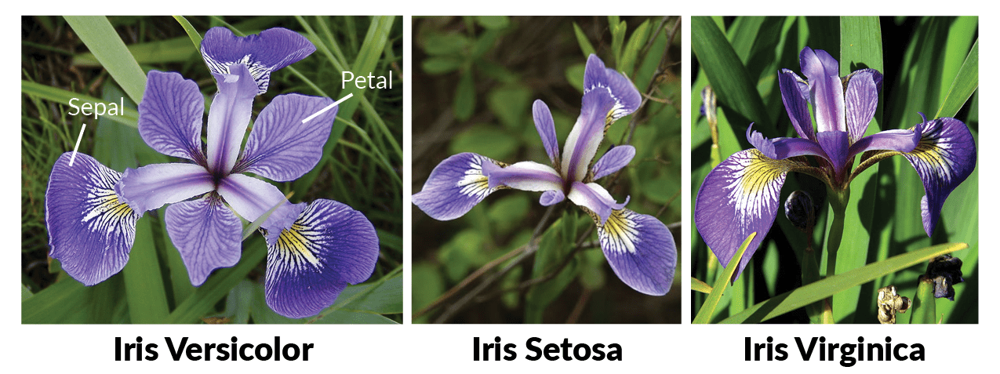

In [ ]:
from IPython.display import Image
url = 'https://s3.amazonaws.com/assets.datacamp.com/blog_assets/Machine+Learning+R/iris-machinelearning.png'
Image(url,width=700, height=250)

In [ ]:
# Grab data
iris_data = DataFrame(X,columns=['Sepal Length','Sepal Width','Petal Length','Petal Width'])
# Grab Target
iris_target = DataFrame(y,columns=['Species'])

In [ ]:
def flower(num):
    ''' Takes in numerical class, returns flower name'''
    if num == 0:
        return 'Setosa'
    elif num == 1:
        return 'Veriscolour'
    else:
        return 'Virginica'

# Apply
iris_target['Species'] = iris_target['Species'].apply(flower)
# Create a combined Iris DataSet
iris = pd.concat([iris_data,iris_target],axis=1)
iris.head()

,Sepal Length,Sepal Width,Petal Length,Petal Width,Species
0,5.1,3.5,1.4,0.2,Setosa
1,4.9,3.0,1.4,0.2,Setosa
2,4.7,3.2,1.3,0.2,Setosa
3,4.6,3.1,1.5,0.2,Setosa
4,5.0,3.6,1.4,0.2,Setosa


In [ ]:
iris.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Sepal Length,150.0,5.843333,0.828066,4.3,5.1,5.80,6.4,7.9
Sepal Width,150.0,3.057333,0.435866,2.0,2.8,3.00,3.3,4.4
Petal Length,150.0,3.758000,1.765298,1.0,1.6,4.35,5.1,6.9
Petal Width,150.0,1.199333,0.762238,0.1,0.3,1.30,1.8,2.5


In [ ]:
iris.Species.value_counts()

,count
Species,
Setosa,50
Veriscolour,50
Virginica,50


If we look at the iris_target data, we'll notice that the Species are still defined as either 0,1,or 2. Let's go ahead and use apply() to split the column, apply a naming scheme function, and then combine it back together.

Let's do some quick visualizations of the data. We can actually do a very broad and quick birds eye view with seaborn's pairplot.

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


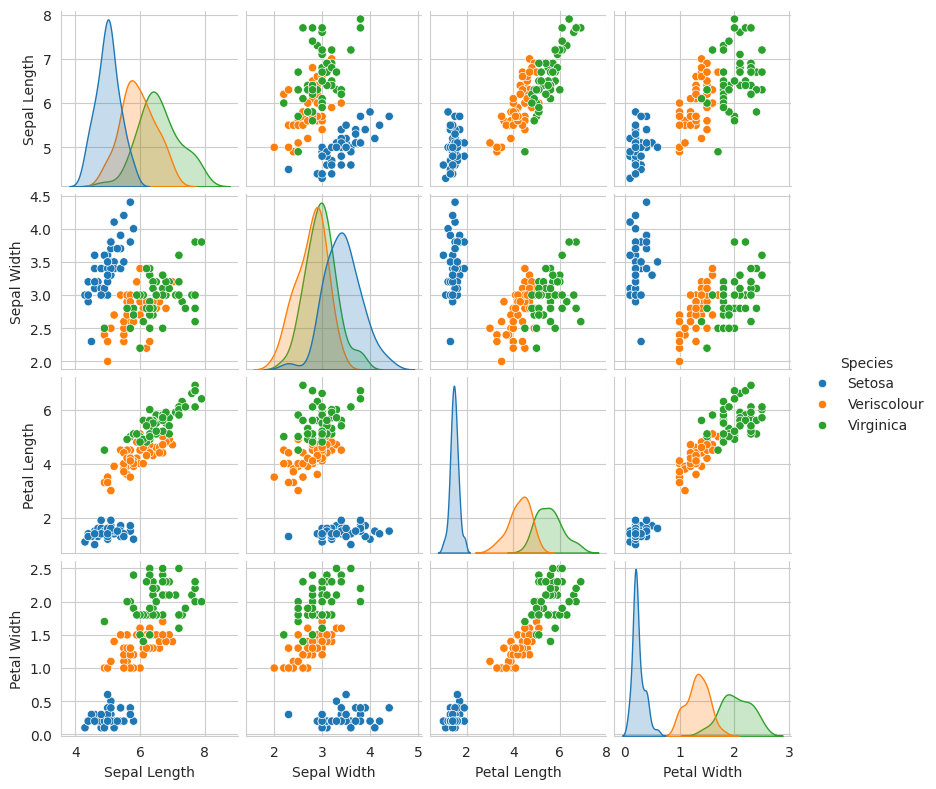

In [ ]:
sns.pairplot(iris,hue='Species',size=2)

## Multiclass classification

- with Logistic Regression (1 part)
- with Decision Tree (2 part)

**Logistic Regression** is a model used for **binary classification** (e.g., Yes/No, 0/1). It predicts the probability of belonging to one of two classes using the **sigmoid function**:

$$
P(y=1|x) = \frac{1}{1 + e^{-z}}, \text{where } z = w^T x + b
$$


<img src="https://towardsdatascience.com/wp-content/uploads/2024/02/0VekmgC745jM1dLCv.png" width="300">

This works well when you have two classes, but fails when there are more than two classes.


<img src="https://towardsdatascience.com/wp-content/uploads/2024/02/13DXIeUmwJAqLHMFBY_y8pg-1024x729.png" width="300" >


Softmax Regression extends Logistic Regression to handle multiple classes (e.g., Class A, B, C, ...). Instead of using a single sigmoid function, it uses the softmax function:

$$
P(y = j|x) = \frac{e^{z_j}}{\sum_{k=1}^{K} e^{z_k}} \text{ for each class } j.
$$

Here:
- $z_j = w_j^T x + b_j$ is the linear score for class $j$.
- $K$ is the number of classes.
- Softmax ensures that the probabilities sum up to 1.



How Does Softmax Regression Work?
- It assigns one weight vector per class.
- During training, it minimizes the categorical cross-entropy loss:

$$
\mathcal{L} = - \sum_{i=1}^{N} \sum_{j=1}^{K} y_{ij} \log(\hat{y}_{ij})
$$

where $y_{ij}$ is 1 if sample $i$ belongs to class $j$, otherwise 0.





**Softmax regression**, also called multinomial logistic regression extends logistic regression to multiple classes.

**Given:**
- dataset $\{(\boldsymbol{x}^{(1)}, y^{(1)}), ..., (\boldsymbol{x}^{(m)}, y^{(m)})\}$
- with $\boldsymbol{x}^{(i)}$ being a $d-$dimensional vector $\boldsymbol{x}^{(i)} = (x^{(i)}_1, ..., x^{(i)}_d)$
- $y^{(i)}$ being the target variable for $\boldsymbol{x}^{(i)}$, for example with $K = 3$ classes we might have $y^{(i)} \in \{0, 1, 2\}$

A softmax regression model has the following features:
- a separate real-valued weight vector $\boldsymbol{w}= (w^{(1)}, ..., w^{(d)})$ for each class. The weight vectors are typically stored as rows in a weight matrix.
- a separate real-valued bias $b$ for each class
- the softmax function as an activation function
- the cross-entropy loss function

The training procedure of a softmax regression model has different steps. In the beginning (step 0) the model parameters are initialized. The other steps (see below) are repeated for a specified number of training iterations or until the parameters have converged.

An illustration of the whole procedure is given below.



*Step 0:* Initialize the weight matrix and bias values with zeros (or small random values).
* * *

*Step 1:* For each class $k$ compute a linear combination of the input features and the weight vector of class $k$, that is, for each training example compute a score for each class. For class $k$ and input vector $\boldsymbol{x}^{(i)}$ we have:

$score_{k}(\boldsymbol{x}^{(i)}) = \boldsymbol{w}_{k}^T \cdot \boldsymbol{x}^{(i)} + b_{k}$

where $\cdot$ is the dot product and $\boldsymbol{w}_{(k)}$ the weight vector of class $k$.
We can compute the scores for all classes and training examples in parallel, using vectorization and broadcasting:

$\boldsymbol{scores} = \boldsymbol{X} \cdot \boldsymbol{W}^T + \boldsymbol{b} $

where $\boldsymbol{X}$ is a matrix of shape $(n_{samples}, n_{features})$ that holds all training examples, and $\boldsymbol{W}$ is a matrix of shape $(n_{classes}, n_{features})$ that holds the weight vector for each class.
* * *

*Step 2:* Apply the softmax activation function to transform the scores into probabilities. The probability that an input vector $\boldsymbol{x}^{(i)}$ belongs to class $k$ is given by

$\hat{p}_k(\boldsymbol{x}^{(i)}) = \frac{\exp(score_{k}(\boldsymbol{x}^{(i)}))}{\sum_{j=1}^{K} \exp(score_{j}(\boldsymbol{x}^{(i)}))}$

Again we can perform this step for all classes and training examples at once using vectorization. The class predicted by the model for $\boldsymbol{x}^{(i)}$ is then simply the class with the highest probability.
* * *

*Step 3:* Compute the cost over the whole training set. We want our model to predict a high probability for the target class and a low probability for the other classes. This can be achieved using the cross entropy loss function:

$J(\boldsymbol{W},b) = - \frac{1}{m} \sum_{i=1}^m \sum_{k=1}^{K} \Big[ y_k^{(i)} \log(\hat{p}_k^{(i)})\Big]$

In this formula, the target labels are *one-hot encoded*. So $y_k^{(i)}$ is $1$ is the target class for $\boldsymbol{x}^{(i)}$ is k, otherwise $y_k^{(i)}$ is $0$.

Note: when there are only two classes, this cost function is equivalent to the cost function of [logistic regression](logistic_regression.ipynb).
* * *

*Step 4:* Compute the gradient of the cost function with respect to each weight vector and bias. A detailed explanation of this derivation can be found [here](http://ufldl.stanford.edu/tutorial/supervised/SoftmaxRegression/).

The general formula for class $k$ is given by:

$ \nabla_{\boldsymbol{w}_k} J(\boldsymbol{W}, b) = \frac{1}{m}\sum_{i=1}^m\boldsymbol{x}^{(i)} \left[\hat{p}_k^{(i)}-y_k^{(i)}\right]$

For the biases, the inputs $\boldsymbol{x}^{(i)}$ will be given 1.
* * *

*Step 5:* Update the weights and biases for each class $k$:

$\boldsymbol{w}_k = \boldsymbol{w}_k - \eta \, \nabla_{\boldsymbol{w}_k} J$  

$b_k = b_k - \eta \, \nabla_{b_k} J$

where $\eta$ is the learning rate.

###Task 1: Implement MultiClassRegression

In [ ]:
class MultiClassLogisticRegression:

    def __init__(self, n_iter=10000, thres=1e-3):
        """
        Initialize the model with maximum iterations and threshold for convergence.
        """
        self.n_iter = n_iter  # Maximum number of iterations for training
        self.thres = thres    # Threshold for stopping when weight updates are small

    def fit(self, X, y, batch_size=64, lr=0.001, rand_seed=4, verbose=False):
        """
        Fit the model using the training data X and labels y.
        """
        np.random.seed(rand_seed)
        self.classes = np.unique(y)
        self.class_labels = {c: i for i, c in enumerate(self.classes)}  # Map classes to indices
        X = self.add_bias(X)  # Add bias term to the input data
        y = self.one_hot(y)  # Convert labels to one-hot encoding
        self.loss = []  # Initialize list to store loss during training
        self.weights = np.zeros(shape=(len(self.classes), X.shape[1]))  # Initialize weights as zero
        self.fit_data(X, y, batch_size, lr, verbose)  # Call the training loop
        return self

    def fit_data(self, X, y, batch_size, lr, verbose):
        """
        Perform gradient descent to optimize the weights.
        """
        i = 0
        while (not self.n_iter or i < self.n_iter):
            self.loss.append(self.cross_entropy(y, self.predict_(X)))  # Calculate and store loss
            idx = np.random.choice(X.shape[0], batch_size)
            X_batch, y_batch = X[idx], y[idx]
            error = y_batch - self.predict_(X_batch)
            update = (lr * np.dot(error.T, X_batch))
            self.weights += update
            if np.abs(update).max() < self.thres:
                break
            if i % 1000 == 0 and verbose:  # Print training accuracy every 1000 iterations if verbose
                print(' Training Accuracy at {} iterations is {}'.format(i, self.evaluate_(X, y)))
            i += 1  # Increment iteration counter

    def predict(self, X):
        """
        Predict the class probabilities for input X.
        """
        return self.predict_(self.add_bias(X))  # Add bias term and call predict_

    def predict_(self, X):
        """
        Perform linear transformation and apply softmax to get class probabilities.
        """
        pre_vals = np.dot(X, self.weights.T).reshape(-1, len(self.classes))  # Linear transformation
        return self.softmax(pre_vals)  # Apply softmax to get probabilities

    def softmax(self, z):
        """
        Compute softmax for each row of the input z.
        """
        return np.exp(z) / np.sum(np.exp(z), axis=1).reshape(-1, 1)  # Softmax formula

    def predict_classes(self, X):
        """
        Predict the class labels (not probabilities) for input X.
        """
        self.probs_ = self.predict(X)  # Get predicted probabilities
        return np.vectorize(lambda c: self.classes[c])(np.argmax(self.probs_, axis=1))

    def add_bias(self, X):
        """
        Add a bias column of ones to the input data.
        """
        return np.insert(X, 0, 1, axis=1)  # Insert a column of ones at the beginning

    def get_randon_weights(self, row, col):
        """
        Initialize weights as zeros (unused method in current code).
        """
        return np.zeros(shape=(row, col))

    def one_hot(self, y):
        """
        Convert class labels to one-hot encoded format.
        """
        return np.eye(len(self.classes))[np.vectorize(lambda c: self.class_labels[c])(y).reshape(-1)]

    def score(self, X, y):
        """
        Calculate the accuracy of the model on input data X with labels y.
        """
        return np.mean(self.predict_classes(X) == y)  # Compare predictions with true labels

    def evaluate_(self, X, y):
        """
        Evaluate accuracy using one-hot encoded labels.
        """
        return np.mean(np.argmax(self.predict_(X), axis=1) == np.argmax(y, axis=1))  # Compare predictions

    def cross_entropy(self, y, probs):
        """
        Calculate the cross-entropy loss between true labels and predicted probabilities.
        """
        return -1 * np.mean(y * np.log(probs))  # Cross-entropy loss formula


Evaluation:

0.98


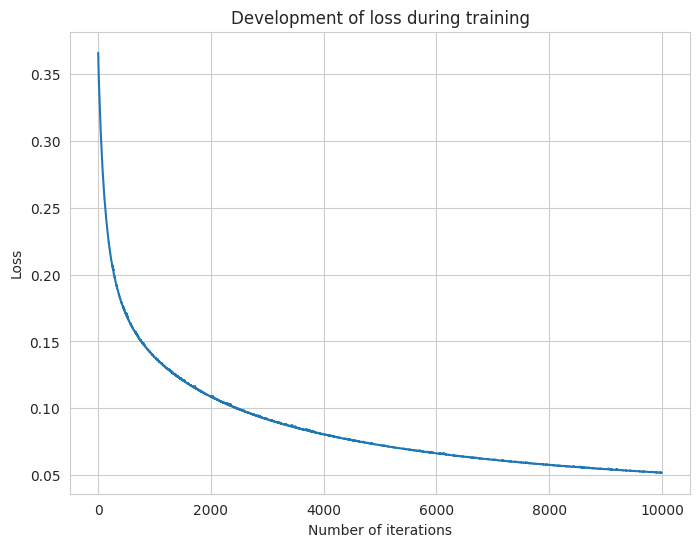

In [ ]:
from sklearn import datasets
X,y = datasets.load_iris(return_X_y=True)
lr = MultiClassLogisticRegression(thres=1e-5)
lr.fit(X,y,lr=0.0001)
print(lr.score(X, y))

fig = plt.figure(figsize=(8,6))
plt.plot(np.arange(len(lr.loss)), lr.loss)
plt.title("Development of loss during training")
plt.xlabel("Number of iterations")
plt.ylabel("Loss")
plt.show()

Shows a smooth, gradually decreasing loss curve.
Lower learning rate causes slow but stable convergence.

#### **One-vs-Rest (OvR) Classification**



<img src="https://developers.google.com/static/machine-learning/crash-course/neural-networks/images/one_vs_all_binary_classifiers.png?hl=ru" width="600">



The **One-vs-Rest (OvR) strategy** trains **one binary classifier per class**, treating it as "this class vs. all others."  
During prediction:
- Each classifier outputs a confidence score.
- The class with the highest score is selected.

Since OvR requires training $ n_{\text{classes}} $ classifiers, its complexity is $ O(n_{\text{classes}}) $, making it **faster than One-vs-One (OvO)** for large datasets.



#### **When to Use OvR?**
✅ Faster for datasets with many classes, since it requires fewer classifiers.  
✅ Works well when one class dominates, as each classifier focuses on a single class.  
❌ May struggle if classes are highly imbalanced, since the majority class often dominates the decision boundary.



/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


=== One-vs-Rest (OvR) Model Performance ===
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        19
  versicolor       1.00      0.85      0.92        13
   virginica       0.87      1.00      0.93        13

    accuracy                           0.96        45
   macro avg       0.96      0.95      0.95        45
weighted avg       0.96      0.96      0.96        45

OvR Accuracy: 0.9556

=== Multinomial Model Performance ===
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        19
  versicolor       1.00      1.00      1.00        13
   virginica       1.00      1.00      1.00        13

    accuracy                           1.00        45
   macro avg       1.00      1.00      1.00        45
weighted avg       1.00      1.00      1.00        45

Multinomial Accuracy: 1.0000


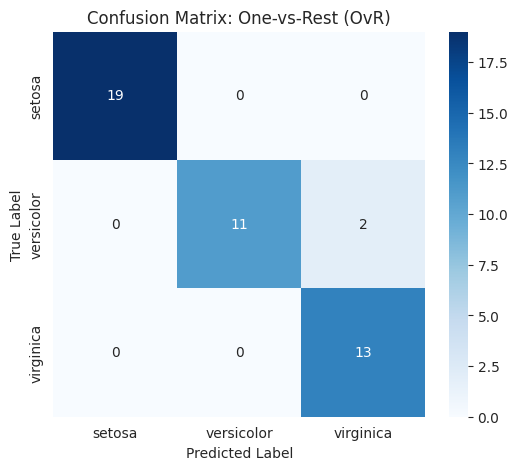

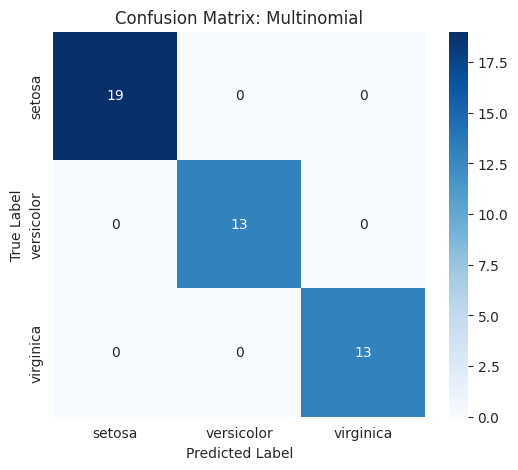

In [ ]:
data = load_iris()
X = data.data
y = data.target

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train One-vs-Rest (OvR) Model
ovr_logreg = LogisticRegression(multi_class='ovr', solver='lbfgs', max_iter=200)
ovr_logreg.fit(X_train, y_train)
ovr_preds = ovr_logreg.predict(X_test)

# Train Multinomial Model
multi_logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=200)
multi_logreg.fit(X_train, y_train)
multi_preds = multi_logreg.predict(X_test)

# Calculate Performance Metrics
print("=== One-vs-Rest (OvR) Model Performance ===")
print(classification_report(y_test, ovr_preds, target_names=data.target_names))
ovr_accuracy = accuracy_score(y_test, ovr_preds)
print(f"OvR Accuracy: {ovr_accuracy:.4f}")

print("\n=== Multinomial Model Performance ===")
print(classification_report(y_test, multi_preds, target_names=data.target_names))
multi_accuracy = accuracy_score(y_test, multi_preds)
print(f"Multinomial Accuracy: {multi_accuracy:.4f}")

# Plot Confusion Matrices
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=data.target_names, yticklabels=data.target_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(title)
    plt.show()

plot_confusion_matrix(y_test, ovr_preds, "Confusion Matrix: One-vs-Rest (OvR)")
plot_confusion_matrix(y_test, multi_preds, "Confusion Matrix: Multinomial")


An important hyperparameter to tune for **multinomial logistic regression is the penalty term**.

A popular type of penalty is the L2 penalty that adds the (weighted) sum of the squared coefficients to the loss function. A weighting of the coefficients can be used that reduces the strength of the penalty from full penalty to a very slight penalty.

By default, the LogisticRegression class uses the L2 penalty with a weighting of coefficients set to 1.0. The type of penalty can be set via the “penalty” argument with values of “l1“, “l2“, “elasticnet” (e.g. both), although not all solvers support all penalty types. The weighting of the coefficients in the penalty can be set via the “C” argument.

This means that values close to 1.0 indicate very little penalty and values close to zero indicate a strong penalty. A C value of 1.0 may indicate no penalty at all.

*  C close to 1.0: Light penalty.
*  C close to 0.0: Strong penalty.

>0.0000 0.978 (0.031)
>0.0001 0.698 (0.045)
>0.0010 0.742 (0.064)
>0.0100 0.873 (0.083)
>0.1000 0.958 (0.050)
>1.0000 0.964 (0.041)


<ipython-input-12-64b8ad4b39df>:31: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(results, labels=names, showmeans=True)


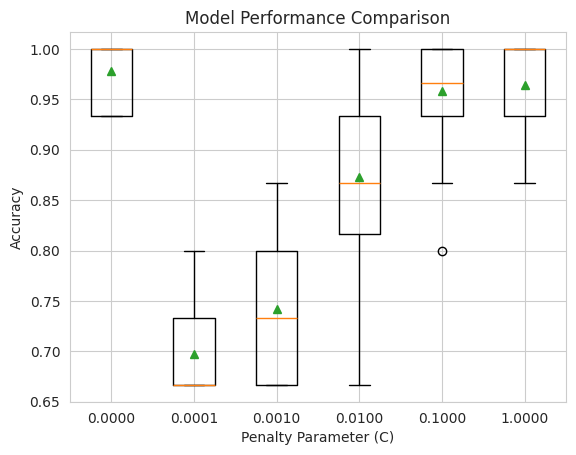

In [ ]:
# Get a list of models to evaluate
def get_models():
    models = dict()
    for p in [0.0, 0.0001, 0.001, 0.01, 0.1, 1.0]:
        key = '%.4f' % p
        if p == 0.0:
            # No penalty in this case
            models[key] = LogisticRegression(multi_class='multinomial', solver='lbfgs', penalty=None, max_iter=200)
        else:
            models[key] = LogisticRegression(multi_class='multinomial', solver='lbfgs', penalty='l2', C=p, max_iter=200)
    return models

# Evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
    return scores


models = get_models()

# Evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X, y)
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, np.mean(scores), np.std(scores)))


plt.boxplot(results, labels=names, showmeans=True)
plt.title('Model Performance Comparison')
plt.xlabel('Penalty Parameter (C)')
plt.ylabel('Accuracy')
plt.show()


#### **One-vs-One (OvO) Classification**
The **One-vs-One (OvO) strategy** constructs one **binary classifier per class pair**. During prediction:
- Each binary model predicts one of its two classes.
- The class with the most votes is selected.
- In case of a tie, the class with the highest aggregate confidence score is chosen.

Since OvO requires training $ n_{\text{classes}} \times (n_{\text{classes}} - 1) / 2 $ classifiers, its complexity is $ O(n_{\text{classes}}^2) $, making it **slower than One-vs-Rest (OvR)** for large datasets.


#### **When to Use OvO?**
✅ Recommended for Support Vector Machines (SVMs) and Kernel Methods, as these models do not scale well with large datasets.  
✅ Works well when classes are balanced, ensuring fair voting.  
❌ Not ideal for datasets with many classes, as training time increases significantly.  


Now we will use OvO function from sklearn ```OneVsOneClassifier```

Default Decision Tree Accuracy: 1.0
OvR Decision Tree Accuracy: 1.0
OvO Decision Tree Accuracy: 1.0


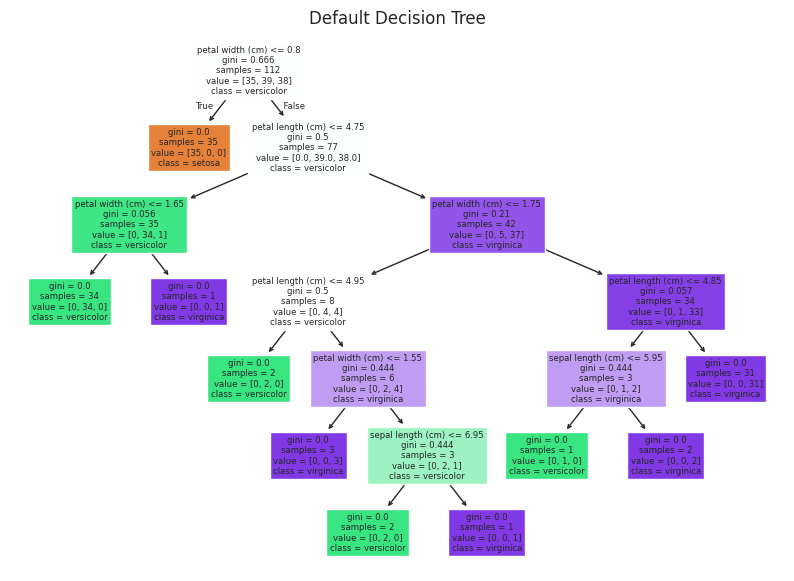

In [ ]:
# Load data
iris = datasets.load_iris()
X, y = iris.data, iris.target
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Default Decision Tree
clf_default = DecisionTreeClassifier()
clf_default.fit(X_train, y_train)
y_pred_default = clf_default.predict(X_test)
print("Default Decision Tree Accuracy:", accuracy_score(y_test, y_pred_default))

# Decision Tree with One-vs-Rest
clf_ovr = OneVsRestClassifier(DecisionTreeClassifier())
clf_ovr.fit(X_train, y_train)
y_pred_ovr = clf_ovr.predict(X_test)
print("OvR Decision Tree Accuracy:", accuracy_score(y_test, y_pred_ovr))

# Decision Tree with One-vs-One
clf_ovo = OneVsOneClassifier(DecisionTreeClassifier())
clf_ovo.fit(X_train, y_train)
y_pred_ovo = clf_ovo.predict(X_test)
print("OvO Decision Tree Accuracy:", accuracy_score(y_test, y_pred_ovo))

# Visualization
def plot_decision_tree(clf, title):
    plt.figure(figsize=(10, 7))
    from sklearn.tree import plot_tree
    plot_tree(clf, filled=True, class_names=iris.target_names, feature_names=iris.feature_names)
    plt.title(title)
    plt.show()

plot_decision_tree(clf_default, "Default Decision Tree")


We got perfect classification with this toy dataset. But our goal in this task was understand how Decesion Tree works with multiclass using different strategies:) **See conclusion**:
*  Default Decision Tree: One tree, direct multiclass classification.
*  OvR Decision Trees: N trees, each solving a binary problem.
*  OvO Decision Trees: N*(N-1)/2 trees, each solving binary classification between pairs of classes.

###Task 2. Perform multi-class classification strategies

In this task, you will deal with the multiclass classification problem for the Glass Classification Data. Let's load the dataset.

In [ ]:
data = pd.read_csv('/content/glass.csv')
X, y = data.drop('Type', axis=1), data.Type
data.sample(3)

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
7,1.51756,13.15,3.61,1.05,73.24,0.57,8.24,0.00,0.00,1
190,1.51613,13.88,1.78,1.79,73.10,0.00,8.67,0.76,0.00,7
13,1.51748,12.86,3.56,1.27,73.21,0.54,8.38,0.00,0.17,1


In [ ]:
data['Type'].value_counts()

,count
Type,
2,76
1,70
7,29
3,17
5,13
6,9


The features of each glass oject correspond to the fraction of the particular chemical element in the object. The target variable corresponds to the type of glass (6 classes).

In this problem, you have to empirically compare the time complexity and performance of several multiclass labeling strategies for different algorithms. You must consider the following algorithms:
* Single Decision Tree (depth 7)
* Medium Random Forest (100 trees of depth 3)
* KNearestNeighbors (5 neighbors)
* Logistic Regression

Note that all these algorithms by default support **multiclass labeling**. Nevertheless, we want you to compare this approach with **OneVSRest** and **OneVSOne** approaches applied to this algorithms. More precisely, for every pair (algorithm, approach) you are to perform 5-fold cross validation on the data and output the validation score and the computation time in the **table** form. Please note that you also have to choose the metric to optimize during CV (e.g. accuracy, balanced accuracy) on your own.

After that, you are to answer the following questions:
* Which metric did you choose to optimize during cross validation and why? Explain
* For which algorithms the usage of OneVSRest/OneVSOne approach provides significantly better performance without significant increase in computation time?

In [ ]:
def multi_class(X, y):
    # Scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Base Models (Multiclass)
    base_models = {
        "Logistic Regression": LogisticRegression(random_state=42, solver='lbfgs'),
        "Random Forest": RandomForestClassifier(random_state=42, n_estimators=100, max_depth=3),
        "KNN": KNeighborsClassifier(n_neighbors=5),
        "Decision Tree": DecisionTreeClassifier(random_state=42, max_depth=7)
    }

    # Wrapped Models for OvR
    ovr_models = {name: OneVsRestClassifier(model) for name, model in base_models.items()}

    # Wrapped Models for OvO
    ovo_models = {name: OneVsOneClassifier(model) for name, model in base_models.items()}

    strategies = ["Multiclass", "OneVsRest", "OneVsOne"]
    all_models = [base_models, ovr_models, ovo_models]

    results_scores = []
    results_times = []

    for models in all_models:
        scores, times = [], []
        for name, model in models.items():
            start = time.perf_counter()
            score = cross_val_score(model, X_scaled, y, scoring=make_scorer(f1_score, average='weighted'), cv=5)
            end = time.perf_counter()

            scores.append(round(np.mean(score), 2))
            times.append(round(end - start, 2))

        results_scores.append(scores)
        results_times.append(times)

    df_scores = pd.DataFrame(results_scores, columns=base_models.keys(), index=strategies)
    df_times = pd.DataFrame(results_times, columns=base_models.keys(), index=strategies)

    return df_scores, df_times

# Example Usage
multi_class(X, y)


(            Logistic Regression  Random Forest   KNN  Decision Tree
 Multiclass                 0.57           0.54  0.60           0.59
 OneVsRest                  0.52           0.59  0.63           0.50
 OneVsOne                   0.54           0.57  0.61           0.61,
             Logistic Regression  Random Forest   KNN  Decision Tree
 Multiclass                 0.55           2.01  0.06           0.04
 OneVsRest                  0.23           4.86  0.08           0.08
 OneVsOne                   0.27          12.35  0.39           0.17)

# **Imbalanced Classification**

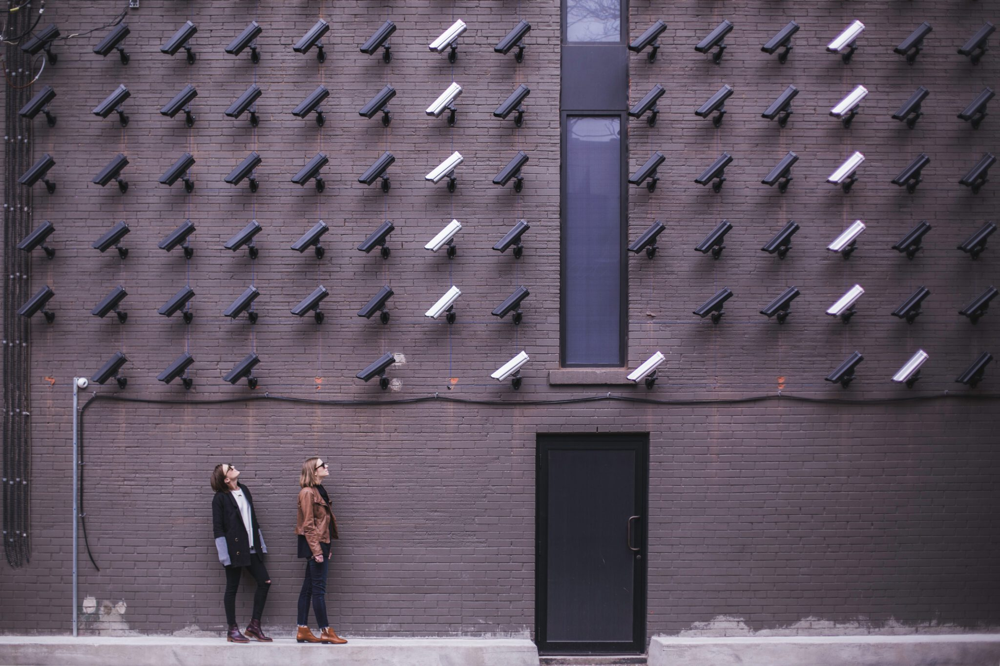


$
S = \{ (\mathbf{x}_i, y_i) \}_{i=1}^{n}, \quad \text{where } \mathbf{x}_i \in \mathbb{R}^{d}, \quad y_i \in \{-1, +1\}
$

- The **majority class** (positive class) is:
  $
  C_{+1}(S) = \{ (\mathbf{x}_i, y_i) \in S \mid y_i = +1 \}
  $
- The **minority class** (negative class) is:
  $
  C_{-1}(S) = \{ (\mathbf{x}_i, y_i) \in S \mid y_i = -1 \}
  $
  where the number of majority class instances exceeds that of the minority class:
  $
  |C_{+1}(S)| > |C_{-1}(S)|
  $

### **Imbalance Ratio**
A common way to quantify imbalance is the **Imbalance Ratio (IR)**, defined as:

$
IR(S) = \frac{|C_{-1}(S)|}{|C_{+1}(S)|}, \quad IR(S) \leq 1
$

A lower imbalance ratio indicates a higher imbalance, where the minority class is much rarer than the majority class.


###### Why is class imbalance a problem?
1. *Biased Predictions:* Standard models tend to predict the majority class more frequently.
2. *Misleading Metrics:* Accuracy becomes unreliable; alternative metrics like F1-score, MCC, and AUC-PR are preferred.
3. *Poor Minority Class Detection:* False negatives can be costly in applications like fraud detection or medical diagnosis.




###Methods to solve the imbalanced problem


- **Data Level approach**
- **Algorithm level approach**
- **Hybrid approach**

###Data Level approach###
An approach to handling the classification imbalanced problem is randomly resampling the training dataset. There are two main techniques to perform randomly resampling:

**Oversampling** by duplicating examples from the minority classes. Several oversampling methods are:

*  Random Over Sampling (ROS) duplicates the minority class data by repeating the original samples until the class distribution is balanced.
*  Synthetic Minority Oversampling Technique (SMOTE) duplicates the minority class data by generating artificial samples based on interpolating between original data of the minority class close to each other.
*  Adaptive Synthetic (ADASYN) learns to generate some synthetic data samples for the minority classes based on dynamic adjustment of weights and adaptive learning of data distributions to cut down the bias.


**Undersampling** by deleting examples from the majority classes. Several oversampling methods are

*  Random Under Sampling (RUS) removes the majority class samples to get balanced data.
*  [Tomek Link](https://imbalanced-learn.org/stable/references/generated/imblearn.under_sampling.TomekLinks.html) detects pairs of nearest neighbors that have different classes to define the boundary between classes
*  Edited Nearest Neighbours (ENN) select some samples to be removed to be balanced with the minority class


Those techniques have pros and cons. Oversampling can lead to model overfitting because this technique duplicates minority instances, while undersampling removes the majority class instance that is sometimes important.

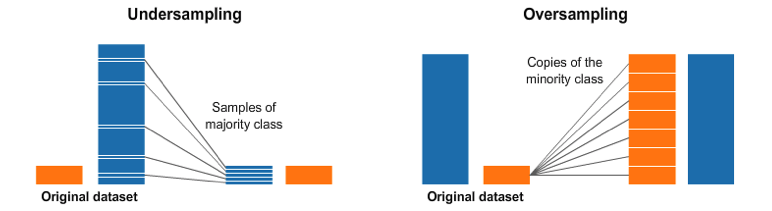

In [ ]:
url = 'https://oralytics.com/wp-content/uploads/2019/05/screenshot-2019-05-20-15.34.14.png'
Image(url,width=700, height=200)

Let's discuss about different sampling techniques for further experiments. We will not stude them in details during this course, but I will unclude for you references to read. We will study them in more general way

**Synthetic Minority Oversampling Technique (SMOTE)**

- **Input parameter:** $k$ (number of neighbors).
- **Oversampling method:** Generates new synthetic samples for the minority class.
- **Initialization:** $S_{\text{new}} := \emptyset$.  
  Repeat $(m - 1)|C_{-1}(S)|$ times:
  
  1. Select randomly $\mathbf{x}_i \in C_{-1}(S)$.
  2. Find $k$ nearest neighbors of $\mathbf{x}_i$ within $C_{-1}(S)$, randomly choose $\mathbf{x}_i'$.
  3. Select a new point $\mathbf{x}_{\text{new}}$ on the segment connecting $\mathbf{x}_i$ and $\mathbf{x}_i'$.
  4. Update: $S_{\text{new}} := S_{\text{new}} \cup \{(\mathbf{x}_{\text{new}}, -1)\}$.

- **Final step:** Add new synthetic samples to the dataset:  
  $r(S) = S \cup S_{\text{new}}$


###Task 3 Implement SMOTE function

In [ ]:
def custom_smote(samples, n, k):
    '''
    n = total number of synthetic samples to generate
    k = number of neighbors
    '''
    synthetic_shape = (n, samples.shape[1])
    synthetic = np.empty(shape=synthetic_shape)
    synthetic_index = 0

    nbrs = NearestNeighbors(n_neighbors=k, metric='euclidean', algorithm='kd_tree').fit(samples)

    for synthetic_index in range(synthetic.shape[0]):
       max_samples_index = samples.shape[0]
       A_idx = np.random.randint(low=0, high=max_samples_index)
       A_point = samples[A_idx]
       #find k+1 neighbors of A_point because one of them is A_point itself
       distances, knn_indices = nbrs.kneighbors(X=[A_point], n_neighbors=(k+1))
       neighbor_array = knn_indices[0]

       #ensure that A_point is not selected as its own neighbor
       if A_idx in neighbor_array:
          condition = np.where(neighbor_array == A_idx)
          neighbor_array = np.delete(neighbor_array, condition)

       len_neighbor_array = len(neighbor_array)
       if len_neighbor_array > 0:
          B_idx = np.random.randint(low=0, high=len_neighbor_array)
       else:
          B_idx = 0

       B_point = samples[neighbor_array[B_idx]]

       # generate a synthetic point between A and B
       if B_point[0] == A_point[0]:
           random_x = B_point[0]
           random_y = np.random.uniform(low=min(A_point[1], B_point[1]), high=max(A_point[1], B_point[1]))
       else:
           m = (B_point[1] - A_point[1])/(B_point[0] - A_point[0])
           random_x = np.random.uniform(low=min(A_point[0], B_point[0]), high=max(A_point[0], B_point[0]))
           random_y = m * (random_x - A_point[0]) + A_point[1]

       synthetic[synthetic_index] = (random_x, random_y)

    return synthetic


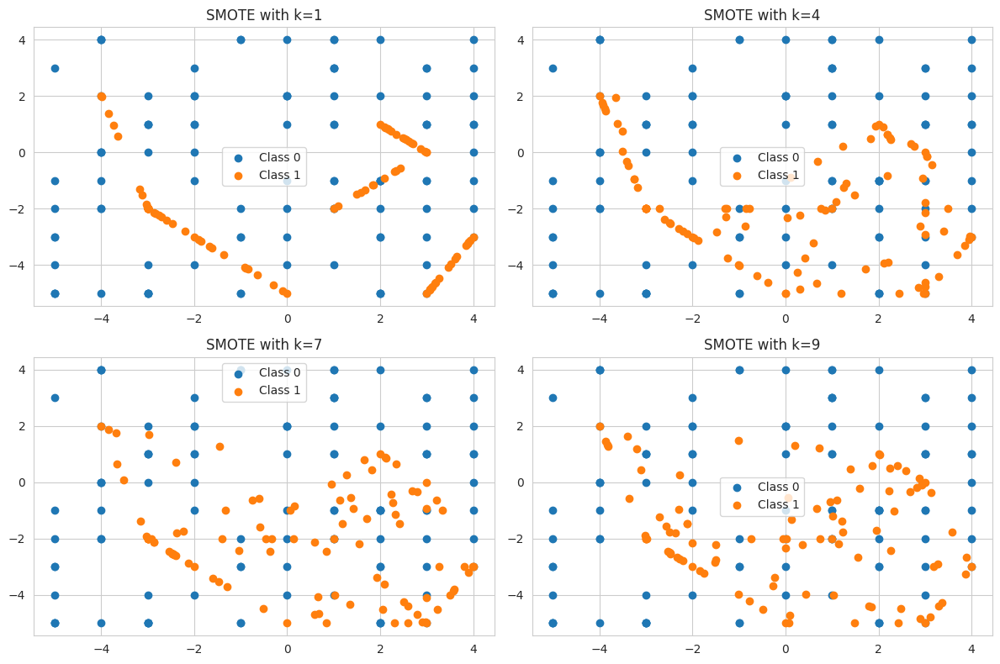

In [ ]:
def plot_smote_effect(X_majority, X_minority, k_values, n_synthetic=90):
    plt.figure(figsize=(12, 8))
    for idx, k in enumerate(k_values, 1):
        synthetic_minority = custom_smote(X_minority, n_synthetic, k)
        X_combined = np.vstack((X_majority, X_minority, synthetic_minority))
        y_combined = np.hstack((np.zeros(X_majority.shape[0]), np.ones(X_minority.shape[0]), np.ones(n_synthetic)))

        plt.subplot(2, 2, idx)
        counter = Counter(y_combined)
        for label in counter.keys():
            row_idx = np.where(y_combined == label)[0]
            plt.scatter(X_combined[row_idx, 0], X_combined[row_idx, 1], label=f'Class {int(label)}')
        plt.title(f'SMOTE with k={k}')
        plt.legend()
    plt.tight_layout()
    plt.show()


# Generate synthetic dataset
np.random.seed(42)
majority_class = np.random.randint(-5, 5, (100, 2))
minority_class = np.random.randint(-5, 5, (10, 2))

k_values = [1, 4, 7, 9]
plot_smote_effect(majority_class, minority_class, k_values)

###Some popular oversampling techniques

During this course we mostly focused on SMOTE, but there are plenty different resampling techniques exist.

We will not stude them in detail during thsi seminar, but I will rpvide you links where you can read details)


*ADASYN: Adaptive Synthetic Sampling*
How it works:

[ADASYN](https://medium.com/@ruinian/an-introduction-to-adasyn-with-code-1383a5ece7aa) starts similarly to SMOTE by identifying k-nearest neighbors for each minority class sample.

But unlike SMOTE, **ADASYN assigns weights to the minority samples based on their difficulty of classification**.
More synthetic samples are generated for harder-to-classify examples (those near decision boundaries).
The number of synthetic samples generated for each minority instance is proportional to the density of majority class neighbors.
The synthetic samples are generated similarly through interpolation but focused on regions that are more challenging for classification.

* ADASYN focuses more on difficult examples, ensuring the model learns better in regions where the decision boundary is ambiguous.


We will see example of ADASYN vs SMOTE

In [ ]:
##Fisrtly we will import some useful functions for us like generating data and plotting
print(__doc__)

import seaborn as sns

sns.set_context("poster")


def create_dataset(
    n_samples=1000,
    weights=(0.01, 0.01, 0.98),
    n_classes=3,
    class_sep=0.8,
    n_clusters=1,
):
    return make_classification(
        n_samples=n_samples,
        n_features=2,
        n_informative=2,
        n_redundant=0,
        n_repeated=0,
        n_classes=n_classes,
        n_clusters_per_class=n_clusters,
        weights=list(weights),
        class_sep=class_sep,
        random_state=0,
    )

def plot_resampling(X, y, sampler, ax, title=None):
    X_res, y_res = sampler.fit_resample(X, y)
    ax.scatter(X_res[:, 0], X_res[:, 1], c=y_res, alpha=0.8, edgecolor="k", s=70)
    if title is None:
        title = f"Resampling with {sampler.__class__.__name__}"
    ax.set_title(title, fontsize=12)
    sns.despine(ax=ax, offset=10)



def plot_decision_function(X, y, clf, ax, title=None):
    plot_step = 0.02
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(
        np.arange(x_min, x_max, plot_step), np.arange(y_min, y_max, plot_step)
    )

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    ax.scatter(X[:, 0], X[:, 1], alpha=0.8, c=y, edgecolor="k",s=70)
    if title is not None:
        ax.set_title(title, fontsize=12)



Automatically created module for IPython interactive environment


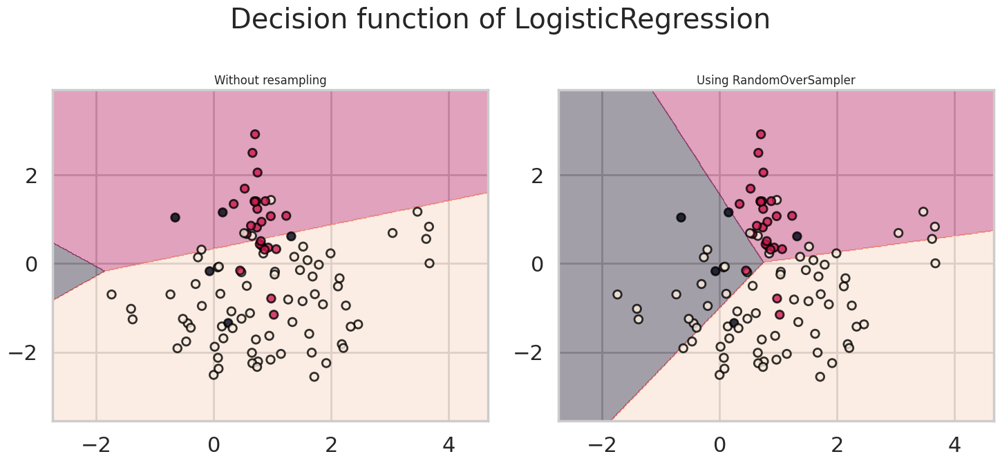

In [ ]:
clf = LogisticRegression()

X, y = create_dataset(n_samples=100, weights=(0.05, 0.25, 0.7))

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))

clf.fit(X, y)
plot_decision_function(X, y, clf, axs[0], title="Without resampling")

sampler = RandomOverSampler(random_state=0)
model = make_pipeline(sampler, clf).fit(X, y)
plot_decision_function(X, y, model, axs[1], f"Using {model[0].__class__.__name__}")

fig.suptitle(f"Decision function of {clf.__class__.__name__}")
fig.tight_layout()

Here we see how decision boundary could be change when we used resampling, int this example we used ROS.


Let's see how new samples are generated using SMOTE and ADASYN:

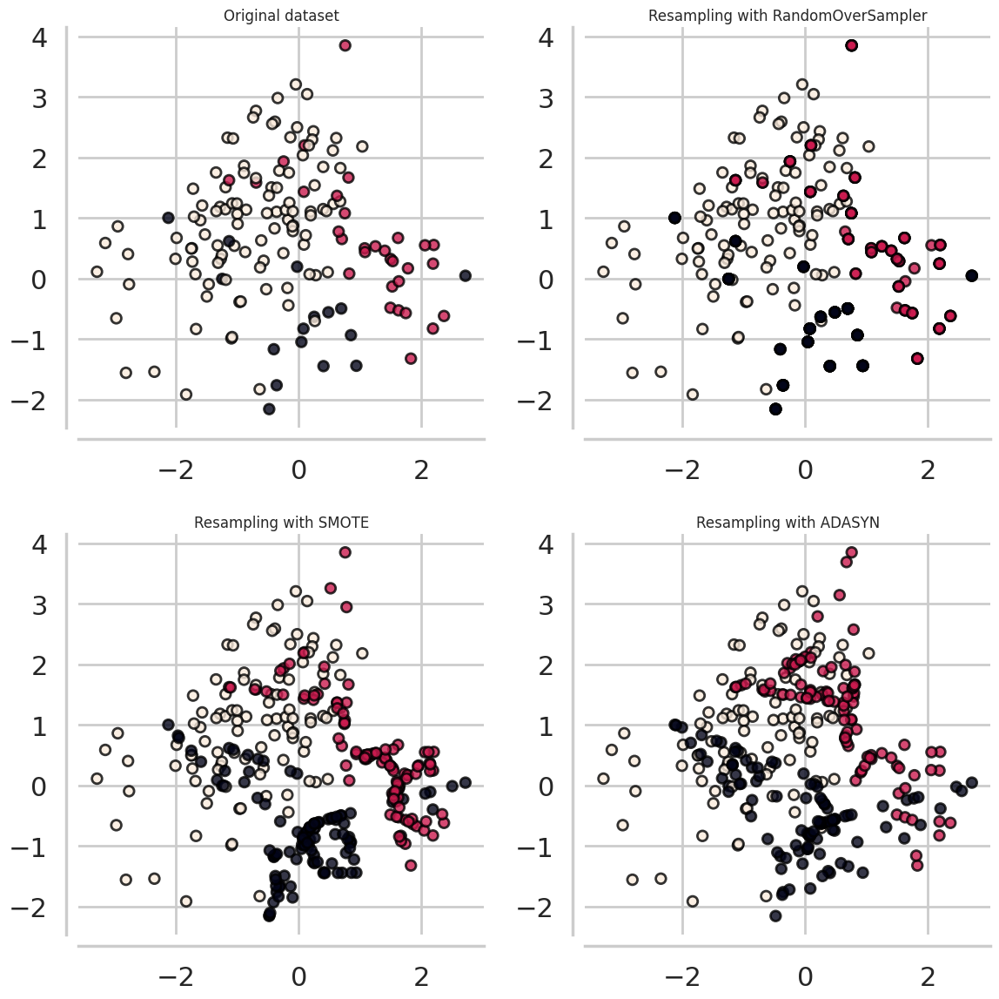

In [ ]:
X, y = create_dataset(n_samples=150, weights=(0.1, 0.2, 0.7))

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

samplers = [
    FunctionSampler(),
    RandomOverSampler(random_state=0),
    SMOTE(random_state=0),
    ADASYN(random_state=0),
]

for ax, sampler in zip(axs.ravel(), samplers):
    title = "Original dataset" if isinstance(sampler, FunctionSampler) else None
    plot_resampling(X, y, sampler, ax, title=title)
fig.tight_layout()

The following plot illustrates the difference between ADASYN and SMOTE. ADASYN will focus on the samples which are difficult to classify with a nearest-neighbors rule while regular SMOTE will not make any distinction. Therefore, the decision function depending of the algorithm.

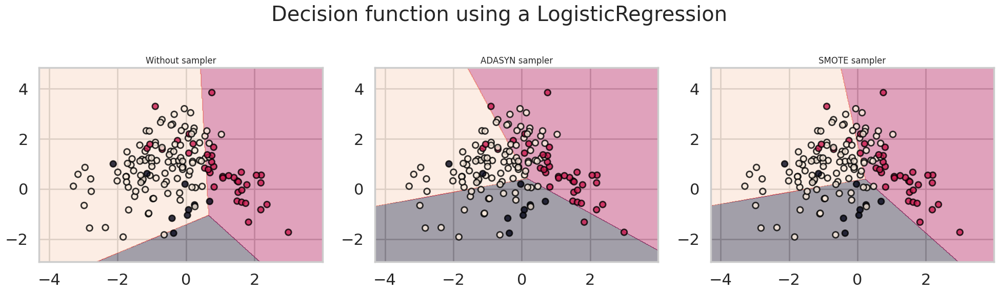

In [ ]:
X, y = create_dataset(n_samples=150, weights=(0.05, 0.25, 0.7))

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 6))

models = {
    "Without sampler": clf,
    "ADASYN sampler": make_pipeline(ADASYN(random_state=0), clf),
    "SMOTE sampler": make_pipeline(SMOTE(random_state=0), clf),
}

for ax, (title, model) in zip(axs, models.items()):
    model.fit(X, y)
    plot_decision_function(X, y, model, ax=ax, title=title)

fig.suptitle(f"Decision function using a {clf.__class__.__name__}")
fig.tight_layout()

Let's prectice with more complicated example! When **Smote or ADASYN could provide some issues** and we need to think and search for other techniques!

Due to those sampling particularities, it can give rise to some specific issues as illustrated below.

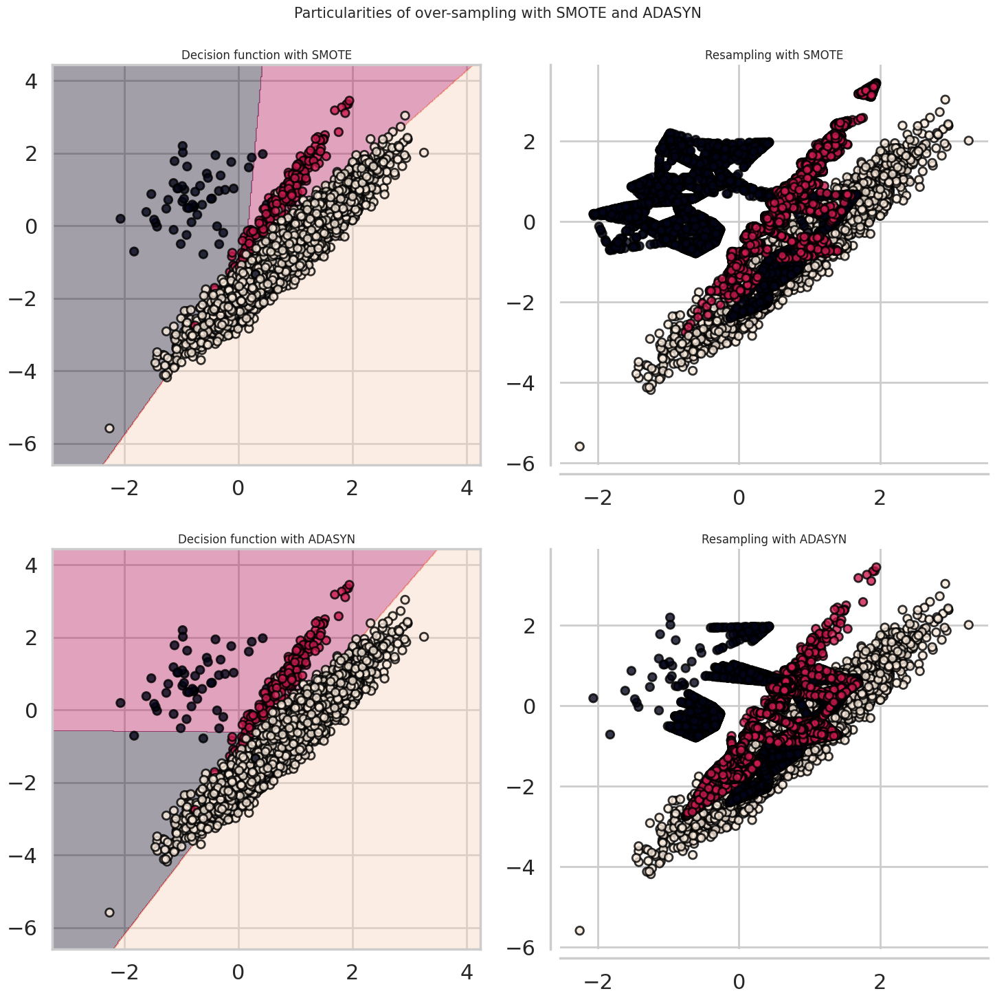

In [ ]:
X, y = create_dataset(n_samples=5000, weights=(0.01, 0.05, 0.94), class_sep=0.8)

samplers = [SMOTE(random_state=0), ADASYN(random_state=0)]

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))
for ax, sampler in zip(axs, samplers):
    model = make_pipeline(sampler, clf).fit(X, y)
    plot_decision_function(
        X, y, clf, ax[0], title=f"Decision function with {sampler.__class__.__name__}"
    )
    plot_resampling(X, y, sampler, ax[1])

fig.suptitle("Particularities of over-sampling with SMOTE and ADASYN", fontsize=15)
fig.tight_layout()

SMOTE proposes several variants by identifying specific samples to consider during the resampling. The borderline version [BorderlineSMOTE](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.BorderlineSMOTE.html#imblearn.over_sampling.BorderlineSMOTE) will detect which point to select which are in the border between two classes. The SVM version [SVMSMOTE](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SVMSMOTE.html#imblearn.over_sampling.SVMSMOTE) will use the support vectors found using an SVM algorithm to create new sample while the KMeans version [KMeansSMOTE](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.KMeansSMOTE.html#imblearn.over_sampling.KMeansSMOTE) will make a clustering before to generate samples in each cluster independently depending each cluster density.

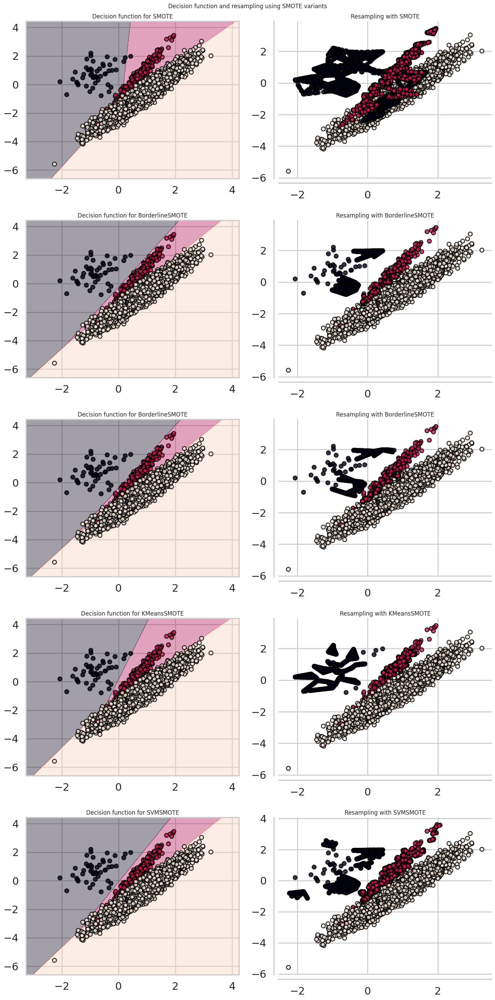

In [ ]:
X, y = create_dataset(n_samples=5000, weights=(0.01, 0.05, 0.94), class_sep=0.8)

fig, axs = plt.subplots(5, 2, figsize=(15, 30))

samplers = [
    SMOTE(random_state=0),
    BorderlineSMOTE(random_state=0, kind="borderline-1"),
    BorderlineSMOTE(random_state=0, kind="borderline-2"),
    KMeansSMOTE(
        kmeans_estimator=MiniBatchKMeans(n_clusters=10, n_init=1, random_state=0),
        random_state=0,
    ),
    SVMSMOTE(random_state=0),
]

for ax, sampler in zip(axs, samplers):
    model = make_pipeline(sampler, clf).fit(X, y)
    plot_decision_function(
        X, y, clf, ax[0], title=f"Decision function for {sampler.__class__.__name__}"
    )
    plot_resampling(X, y, sampler, ax[1])

fig.suptitle("Decision function and resampling using SMOTE variants", fontsize=12)
fig.tight_layout()

Now we will compare different resampling methods and see results!

In [ ]:
X, y = sklearn.datasets.make_classification(n_samples=5000, n_features=2, n_informative=2,
                                            n_redundant=0, n_repeated=0, n_classes=2,
                                            n_clusters_per_class=1,
                                            weights=[0.95, 0.05],
                                            class_sep=0.5, random_state=0)

dataset_df = pd.DataFrame({'X1':X[:,0],'X2':X[:,1], 'Y':y})

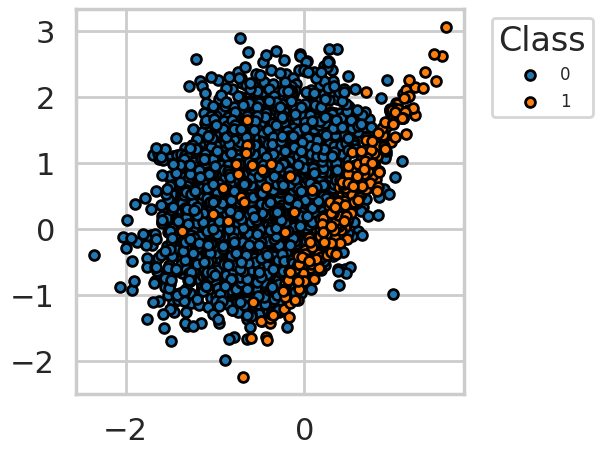

In [ ]:
fig_distribution, ax = plt.subplots(1, 1, figsize=(5,5))

groups = dataset_df.groupby('Y')
for name, group in groups:
    ax.scatter(group.X1, group.X2, edgecolors='k', label=name,alpha=1,marker='o', s=50)

ax.legend(loc='upper left',
          bbox_to_anchor=(1.05, 1),
          title="Class", fontsize=12)

The dataset contains 5000 samples with two classes, labeled 0 and 1. 95% of the samples are associated to the class 0, and 5% of the samples to the class 1.

The performances of a baseline classifier without resampling is obtained with the ```kfold_cv_with_classifier function```. A decision tree of depth five and a 5-fold stratified cross-validation gives us the following baseline classification performances.

In [ ]:
def kfold_cv_with_classifier(classifier, X, y, n_splits=5, strategy_name="Baseline classifier"):

    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=0)
    try:
        cv_results_ = cross_validate(classifier, X, y, cv=cv,
                                     scoring=['roc_auc', 'average_precision', 'balanced_accuracy'],
                                     return_estimator=True)  # Get trained classifiers
    except Exception as e:
        print(f"Error during cross-validation: {e}")
        return None

    # Step 4: Convert results to DataFrame
    try:
        results = pd.DataFrame(cv_results_)
        print("🔹 First few rows of results DataFrame:")
        print(results.head())

        # Drop the 'estimator' column before computing mean
        results = results.drop(columns=['estimator'], errors='ignore')

        results_mean = results.mean().values
        results_std = results.std().values

        results_df = pd.DataFrame([[f"{round(results_mean[i], 3)} +/- {round(results_std[i], 3)}" for i in range(len(results_mean))]],
                                  columns=['Fit time (s)', 'Score time (s)', 'AUC ROC', 'Average Precision', 'Balanced accuracy'])

        results_df.rename(index={0: strategy_name}, inplace=True)
    except Exception as e:
        print(f"Error processing results DataFrame: {e}")
        return None

    try:
        classifier_0 = cv_results_['estimator'][0]
        print("Selected first trained classifier!")
    except Exception as e:
        print(f"Error selecting classifier: {e}")
        return None

    # Step 6: Create train/test splits
    try:
        train_index, test_index = next(cv.split(X, y))
        train_df = pd.DataFrame({'X1': X[train_index, 0], 'X2': X[train_index, 1], 'Y': y[train_index]})
        test_df = pd.DataFrame({'X1': X[test_index, 0], 'X2': X[test_index, 1], 'Y': y[test_index]})

        print("Train/Test DataFrames created successfully!")
    except Exception as e:
        print(f"Error creating train/test DataFrames: {e}")
        return None

    print("Function execution complete! Returning outputs...")

    return results_df, classifier_0, train_df, test_df


In [ ]:
def plot_decision_boundary(classifier_0, train_df, test_df):
    fig_decision_boundary, ax = plt.subplots(1, 3, figsize=(15, 5))

    # Helper function to plot decision boundary
    def plot_boundary(ax, classifier, data, title, plot_training_data=True):
        X = data.iloc[:, :-1].values
        y = data.iloc[:, -1].values
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                             np.arange(y_min, y_max, 0.1))
        Z = classifier.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.RdYlBu_r)
        if plot_training_data:
            ax.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.RdYlBu_r, edgecolors='k', s=50)
        ax.set_title(title, fontsize=12)

    plot_boundary(ax[0], classifier_0, train_df, "Decision surface with training data", plot_training_data=True)
    plot_boundary(ax[1], classifier_0, train_df, "Decision surface", plot_training_data=False)
    plot_boundary(ax[2], classifier_0, test_df, "Decision surface with test data", plot_training_data=True)

    ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")
    sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlBu_r, norm=plt.Normalize(vmin=0, vmax=1))
    cax = fig_decision_boundary.add_axes([0.93, 0.15, 0.02, 0.5])
    fig_decision_boundary.colorbar(sm, cax=cax, alpha=0.3, boundaries=np.linspace(0, 1, 11))

    return fig_decision_boundary


🔹 First few rows of results DataFrame:
   fit_time  score_time                                          estimator  \
0  0.011042    0.004862  DecisionTreeClassifier(max_depth=5, random_sta...   
1  0.007874    0.006719  DecisionTreeClassifier(max_depth=5, random_sta...   
2  0.010941    0.006581  DecisionTreeClassifier(max_depth=5, random_sta...   
3  0.009092    0.005773  DecisionTreeClassifier(max_depth=5, random_sta...   
4  0.008233    0.004114  DecisionTreeClassifier(max_depth=5, random_sta...   

   test_roc_auc  test_average_precision  test_balanced_accuracy  
0      0.933071                0.616241                0.842338  
1      0.870654                0.493366                0.739429  
2      0.897003                0.493411                0.798959  
3      0.927952                0.590885                0.812446  
4      0.900752                0.447122                0.737844  
Selected first trained classifier!
Train/Test DataFrames created successfully!
Function executio

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


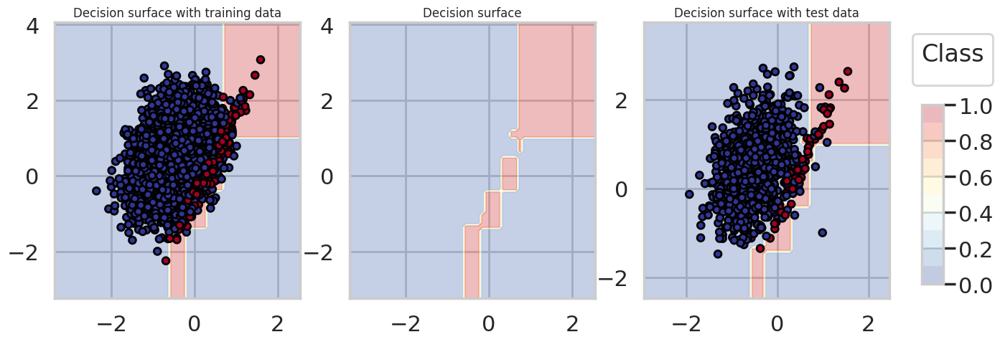

In [ ]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_dt_baseline, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                     X, y,
                                                                                     n_splits=5,
                                                                                     strategy_name="Decision tree - Baseline")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
results_df_dt_baseline

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.009 +/- 0.001,0.006 +/- 0.001,0.906 +/- 0.025,0.528 +/- 0.072,0.786 +/- 0.046


Samplers can be combined with sklearn estimators using pipelines. The addition of a sampling step in the cross-validation procedure is therefore simple and consists in creating a pipeline made of a sampler, and an estimator.

The implementation is provided below, in the ```kfold_cv_with_sampler_and_classifier``` function.

In [ ]:
def kfold_cv_with_sampler_and_classifier(
    classifier,
    sampler_list,
    X,
    y,
    n_splits=5,
    strategy_name="Baseline classifier"
):
    """
    Build a pipeline of (sampler(s) -> classifier), run cross-validation,
    and return the pipeline results plus the data used in the first fold.
    """
    # 1) Build the pipeline
    #    Each item in sampler_list is like ('ros', RandomOverSampler(...))
    estimators = sampler_list.copy()
    estimators.append(("clf", classifier))
    pipe = imblearn.pipeline.Pipeline(estimators)

    # 2) Cross-validate
    cv = sklearn.model_selection.StratifiedKFold(
        n_splits=n_splits, shuffle=True, random_state=0
    )

    cv_results_ = sklearn.model_selection.cross_validate(
        pipe, X, y, cv=cv,
        scoring=["roc_auc", "average_precision", "balanced_accuracy"],
        return_estimator=True
    )

    # 3) Summarize metrics
    results_df = pd.DataFrame(cv_results_).round(3)
    mean_ = results_df.mean(numeric_only=True).round(3)
    std_  = results_df.std(numeric_only=True).round(3)
    summary_row = [
        f"{mean_[col]} +/- {std_[col]}"
        for col in ["fit_time", "score_time", "test_roc_auc", "test_average_precision", "test_balanced_accuracy"]
    ]
    final_results_df = pd.DataFrame(
        [summary_row],
        columns=["Fit time (s)", "Score time (s)", "AUC ROC", "Average Precision", "Balanced accuracy"],
        index=[strategy_name]
    )

    # 4) Extract the pipeline fitted on the FIRST fold
    fitted_pipeline_0 = cv_results_["estimator"][0]

    # 5) Get the actual train/test indices for the FIRST fold
    (train_index, test_index) = next(cv.split(X, y))  # first fold
    X_train, y_train = X[train_index], y[train_index]
    X_test,  y_test  = X[test_index],  y[test_index]

    X_resampled, y_resampled = X_train, y_train
    for name, sampler in sampler_list:
        X_resampled, y_resampled = sampler.fit_resample(X_resampled, y_resampled)

    # 6) Build quick dataframes for inspection
    train_df = pd.DataFrame({
        "X1": X_resampled[:, 0],
        "X2": X_resampled[:, 1],
        "Y":  y_resampled
    })
    test_df = pd.DataFrame({
        "X1": X_test[:, 0],
        "X2": X_test[:, 1],
        "Y":  y_test
    })

    # 7) Return
    return final_results_df, fitted_pipeline_0, train_df, test_df


*   **SMOTE**

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


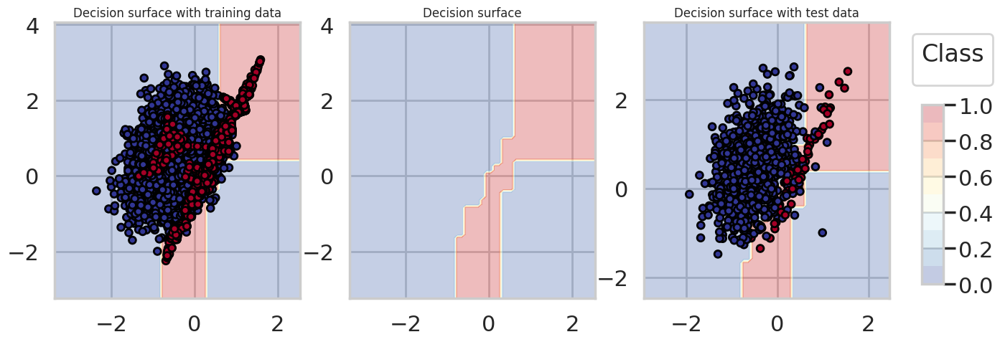

In [ ]:
sampler_list = [('sampler', imblearn.over_sampling.SMOTE(sampling_strategy=1, random_state=0))]
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)

(results_df_SMOTE, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                           sampler_list,
                                                                                           X, y,
                                                                                           n_splits=5,
                                                                                           strategy_name="Decision tree - SMOTE")


fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

The decision boundary is also shifted towards the minority class. We note that, contrary to random oversampling, new examples have been generated for the minority class.

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,3784
1,3784


*  **Undersampling**

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


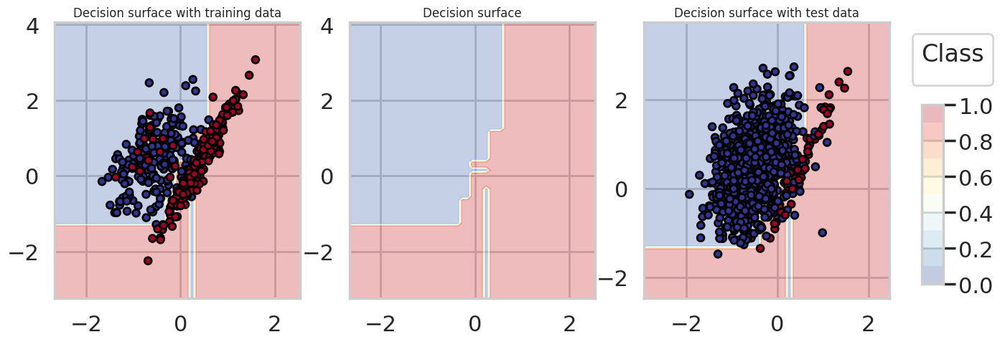

In [ ]:
sampler_list = [('sampler', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1, random_state=0))]
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)
(results_df_RUS, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                         sampler_list,
                                                                                         X, y,
                                                                                         n_splits=5,
                                                                                         strategy_name="Decision tree - RUS")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

The plotting of training samples shows that the number of samples from the majority class was significantly reduced, allowing a shift of the decision boundary towards the minority class. Contrary to oversampling techniques, the region located at the bottom right is now associated with the minority class, since all samples of class 0 from this region have been removed.

*   **Edited Nearest Neighbor**

The ENN technique operates in the following steps:

1. Compute the k nearest neighbors for each instance in the dataset.
2. Compare the class label of each instance with the class label of its k nearest neighbors.
3. Remove instances from the majority class that are misclassified by their neighbors, thereby refining the dataset.


<img src="https://www.researchgate.net/publication/341174962/figure/fig2/AS:920049644752897@1596368337374/The-idea-of-Edited-Nearest-Neighbor.png" width="600">


<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


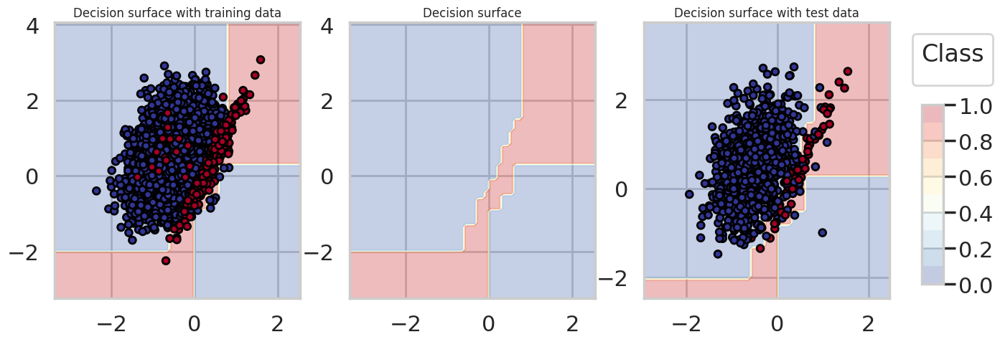

In [ ]:
sampler_list = [('sampler', imblearn.under_sampling.EditedNearestNeighbours(sampling_strategy='majority',n_neighbors=3))]
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)
(results_df_ENN, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                         sampler_list,
                                                                                         X, y,
                                                                                         n_splits=5,
                                                                                         strategy_name="Decision tree - ENN")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,3572
1,216


With a number of neighbors n_neighbors set to three, ENN only removes around 200 samples out of the 3784 samples of the majority class. The number of samples from the minority class is unchanged.

The plotting of training samples shows that the distributions of the two classes are similar to the original distributions. The samples that were removed lied in the overlapping region, and their removal is therefore not visible due to the large amount of remaining samples. We however observe a shift in the decicision boundary, since the decision tree now classifies samples from the overlapping region into the minority class.

**SMOTE + RUS**

In [ ]:
sampler_list = [('sampler1', imblearn.over_sampling.SMOTE(sampling_strategy=0.5,random_state=0)),
                ('sampler2', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1.0,random_state=0))
               ]
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)
estimators = sampler_list.extend([('clf', classifier)])
pipe = imblearn.pipeline.Pipeline(estimators)

The SMOTE oversampling aimed at an imbalance ratio of 0.5. Since the original dataset contains 3784 sample of the majority class, SMOTE create new samples until the number of minority class samples reached 3784/2=1892
 samples. The random undersampling aimed at an imbalance ratio of 1. Since the SMOTE resampled dataset contains 1892 samples of the minority class, samples of the majority class are removed until their number reached 1892 samples.

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


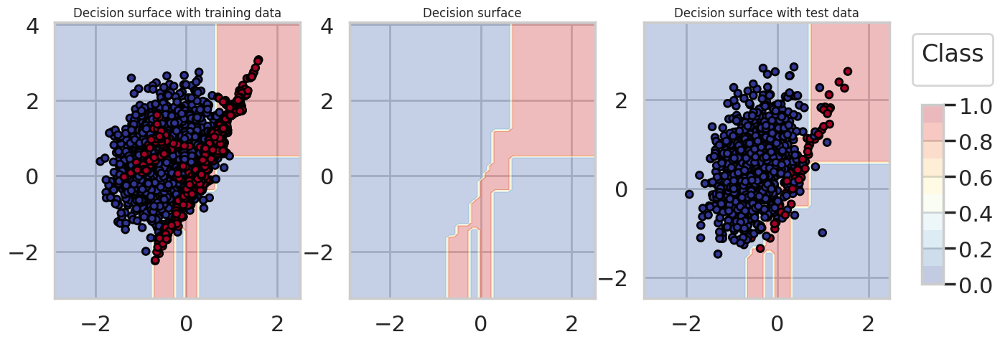

In [ ]:
sampler_list = [('sampler1', imblearn.over_sampling.SMOTE(sampling_strategy=0.5,random_state=0)),
                ('sampler2', imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1.0,random_state=0))
               ]

classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5, random_state=0)
(results_df_combined, classifier_0, train_df, test_df) = kfold_cv_with_sampler_and_classifier(classifier,
                                                                                              sampler_list,
                                                                                              X, y,
                                                                                              n_splits=5,
                                                                                              strategy_name='Decision tree - Combined SMOTE and RUS')

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
train_df['Y'].value_counts()

,count
Y,
0,1892
1,1892


In [ ]:
pd.concat([results_df_dt_baseline,
           results_df_SMOTE,
           results_df_RUS,
           results_df_ENN,
           results_df_combined])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.009 +/- 0.001,0.006 +/- 0.001,0.906 +/- 0.025,0.528 +/- 0.072,0.786 +/- 0.046
Decision tree - SMOTE,0.058 +/- 0.087,0.006 +/- 0.0,0.913 +/- 0.032,0.499 +/- 0.056,0.91 +/- 0.019
Decision tree - RUS,0.005 +/- 0.001,0.006 +/- 0.0,0.913 +/- 0.02,0.408 +/- 0.058,0.896 +/- 0.023
Decision tree - ENN,0.021 +/- 0.003,0.007 +/- 0.001,0.879 +/- 0.038,0.474 +/- 0.08,0.857 +/- 0.041
Decision tree - Combined SMOTE and RUS,0.02 +/- 0.002,0.01 +/- 0.001,0.915 +/- 0.012,0.494 +/- 0.062,0.912 +/- 0.005


###Algorithm-Level Techniques for Handling Data Imbalance

*   **Class Weighting:**

Many machine learning algorithms allow you to assign different weights to different classes. By assigning higher weights to the minority class and lower weights to the majority class, you can instruct the model to pay more attention to the minority class during training. This is especially useful for algorithms like logistic regression and support vector
*   **Cost-Sensitive Learning:**

Cost-sensitive learning is a more advanced version of class weighting. It involves explicitly assigning different misclassification costs to classes. Algorithms are then trained to minimize the overall cost, which can be skewed toward the minority class. This approach encourages the model to focus on correctly classifying the minority class, even if it
results in more false positives in the majority class.

*    **Algorithm Selection:**

Some machine learning algorithms are naturally better suited to handling imbalanced data. For example, tree-based models like Random Forest and ensemble methods like AdaBoost are often robust choices for imbalanced datasets. These models can handle class imbalance by design, as they partition data into subsets based on class and make decisions independently in each subset.

*   **Threshold Adjustment:**

By modifying the classification threshold, you can control the trade-off between precision and recall in a binary classification problem. Lowering the threshold can increase recall, making the model more sensitive to
the minority class, albeit at the cost of precision.

*   **Anomaly Detection:**

For extreme class imbalance, you can treat the minority class as anomalies and employ specialized anomaly
detection techniques. Methods like One-Class SVM, Isolation Forest, and Local Outlier Factor are designed to
identify rare and unusual instances, making them well-suited for this scenario. (following lecture and seminar)

###Cost sensitive learning

Let us now set the class weights so that false positives have a weight equal to the imbalance ratio.

In [ ]:
IR=0.05/0.95

In [ ]:
class_weight={0:IR,1:1}

🔹 First few rows of results DataFrame:
   fit_time  score_time                                          estimator  \
0  0.012381    0.004809  DecisionTreeClassifier(class_weight={0: 0.0526...   
1  0.008502    0.004551  DecisionTreeClassifier(class_weight={0: 0.0526...   
2  0.008140    0.004287  DecisionTreeClassifier(class_weight={0: 0.0526...   
3  0.008479    0.004432  DecisionTreeClassifier(class_weight={0: 0.0526...   
4  0.008443    0.004720  DecisionTreeClassifier(class_weight={0: 0.0526...   

   test_roc_auc  test_average_precision  test_balanced_accuracy  
0      0.875998                0.533251                0.883623  
1      0.841966                0.475874                0.875421  
2      0.899499                0.436311                0.913789  
3      0.934843                0.518281                0.925162  
4      0.883232                0.391496                0.891571  
Selected first trained classifier!
Train/Test DataFrames created successfully!
Function executio

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


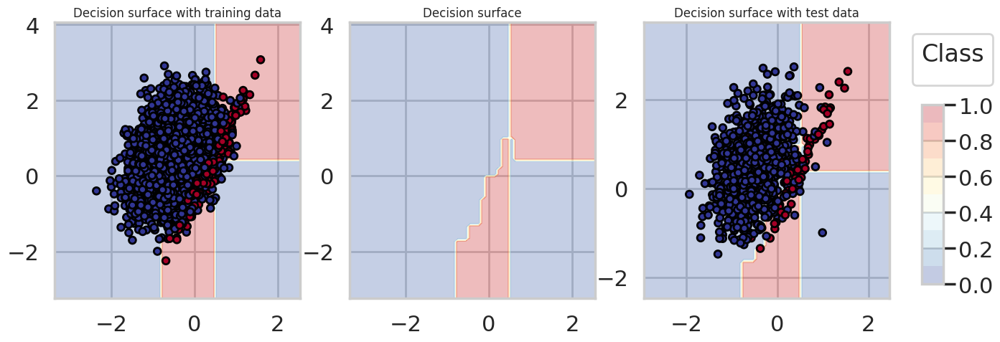

In [ ]:
classifier = sklearn.tree.DecisionTreeClassifier(max_depth=5,class_weight=class_weight,random_state=0)

(results_df_dt_cost_sensitive, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                         X, y,
                                                                         n_splits=5,
                                                                         strategy_name="Decision tree - Cost-sensitive")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)


In [ ]:
pd.concat([results_df_dt_baseline,
           results_df_dt_cost_sensitive])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Decision tree - Baseline,0.009 +/- 0.001,0.006 +/- 0.001,0.906 +/- 0.025,0.528 +/- 0.072,0.786 +/- 0.046
Decision tree - Cost-sensitive,0.009 +/- 0.002,0.005 +/- 0.0,0.887 +/- 0.034,0.471 +/- 0.058,0.898 +/- 0.021


We observe that the decision boundary was shifted towards samples from the minority class. This shift allowed to increase the performance in terms of balanced accuracy, which increased from 0.786+/-0.046 to 0.898+/-0.021. We note however that the performances in terms of AUC ROC and Average Precision both decreased.

####**Ensemble methods**



Ensemble methods consist in training multiple prediction models for the same prediction task, and in combining their outputs to make the final prediction. Ensembles of models very often allow to provide better prediction performances than single models, since combining the predictions from multiple models usually allows to reduce the overfitting phenomenon. The prediction models making up an ensemble are referred to as baseline learners. Both the way with which the baseline learners are constructed and how their predictions are combined are key factors in the design of an ensemble.

Ensemble methods can be broadly divided into *parallel-based* and *iterative-based* ensembles. In parallel-based ensembles, each baseline learner is trained in parallel, using either a subset of the training data, a subset of the training features, or a combination of both. The two most popular techniques for parallel-based ensembles are bagging and random forest. In iterative-based ensembles, also referred to as boosting, the baseline classifiers are trained in sequence, with each learner in the sequence aiming at minimizing the prediction errors of the previous learner. The currently most widely-used implementations for boosting are XGBoost, CatBoost and LightGBM.

![](https://fraud-detection-handbook.github.io/fraud-detection-handbook/_images/parallel_based_framework.png)

Parallel-based framework in the context of imbalanced data. Sampling strategies may be applied at the level of samples or features (or both) before training the baseline classifiers

**Bagging**

Bagging relies on the concept of bootstrap aggregating, which consists of training several baseline learners with different replicas of the original training set. The most usual practice is to randomly draw, with replacement, instances from the original dataset.

🔹 First few rows of results DataFrame:
   fit_time  score_time                                          estimator  \
0  0.655935    0.052011  (DecisionTreeClassifier(max_depth=5, random_st...   
1  0.624416    0.046620  (DecisionTreeClassifier(max_depth=5, random_st...   
2  0.625447    0.047110  (DecisionTreeClassifier(max_depth=5, random_st...   
3  0.634720    0.048332  (DecisionTreeClassifier(max_depth=5, random_st...   
4  0.619996    0.045979  (DecisionTreeClassifier(max_depth=5, random_st...   

   test_roc_auc  test_average_precision  test_balanced_accuracy  
0      0.945893                0.677290                0.799213  
1      0.938699                0.610614                0.703449  
2      0.957120                0.575113                0.774881  
3      0.941166                0.630019                0.751331  
4      0.930193                0.490813                0.710594  
Selected first trained classifier!
Train/Test DataFrames created successfully!
Function executio

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


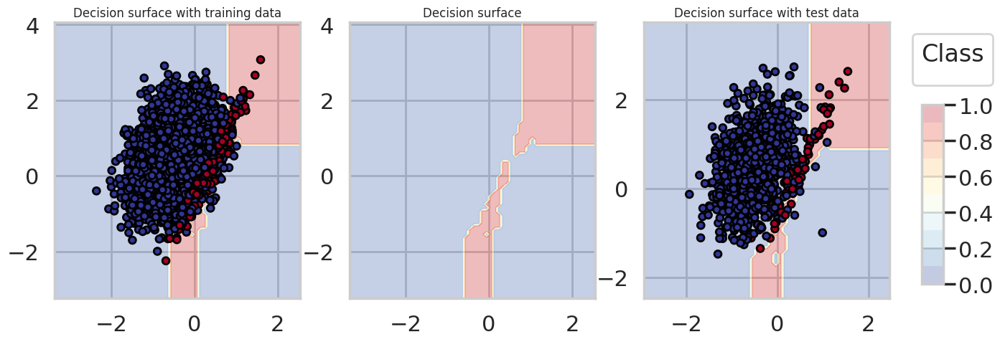

In [ ]:
classifier = sklearn.ensemble.BaggingClassifier(estimator=sklearn.tree.DecisionTreeClassifier(max_depth=5,random_state=0),
                                                n_estimators=100,
                                                bootstrap=True,
                                                random_state=0)


(results_df_bagging, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                 X, y,
                                                                                 n_splits=5,
                                                                                 strategy_name="Bagging")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
results_df_bagging

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.632 +/- 0.014,0.048 +/- 0.002,0.943 +/- 0.01,0.597 +/- 0.07,0.748 +/- 0.041


The classification performances of this bagging classifier are better than those of a single decision tree (see baseline results in cost-sensitive larning) for AUC ROC and Average Precision but lower in terms of balanced accuracy.

Compared to a single decision tree, the decision boundary is more refined. Most of the samples lying on the overlapping region are however classified into the majority class due to the imbalanced nature of the dataset.

**Balanced bagging**

Balanced bagging follows the same strategy as bagging, except that the training data is resampled using imbalanced learning techniques. An implementation of balanced bagging is provided by the BalancedBaggingClassifier object of the imblearn library. The type of sampler and desired imbalance ratio are set with the sampler and sampling_strategy parameters, respectively. The default parameters consist of using a random undersampler and an imbalance ratio of 1, which means that samples from the majority class are randomly removed until their number equals that of the minority class (see Section Undersampling).

🔹 First few rows of results DataFrame:
   fit_time  score_time                                          estimator  \
0  0.440812    0.098074  ((RandomUnderSampler(random_state=1702673635, ...   
1  0.438298    0.098501  ((RandomUnderSampler(random_state=1702673635, ...   
2  0.440880    0.101749  ((RandomUnderSampler(random_state=1702673635, ...   
3  0.425373    0.113603  ((RandomUnderSampler(random_state=1702673635, ...   
4  0.425836    0.101219  ((RandomUnderSampler(random_state=1702673635, ...   

   test_roc_auc  test_average_precision  test_balanced_accuracy  
0      0.947665                0.629708                0.908758  
1      0.947273                0.595906                0.909287  
2      0.956532                0.555701                0.935753  
3      0.952735                0.647113                0.931779  
4      0.931887                0.502974                0.915649  
Selected first trained classifier!
Train/Test DataFrames created successfully!
Function executio

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


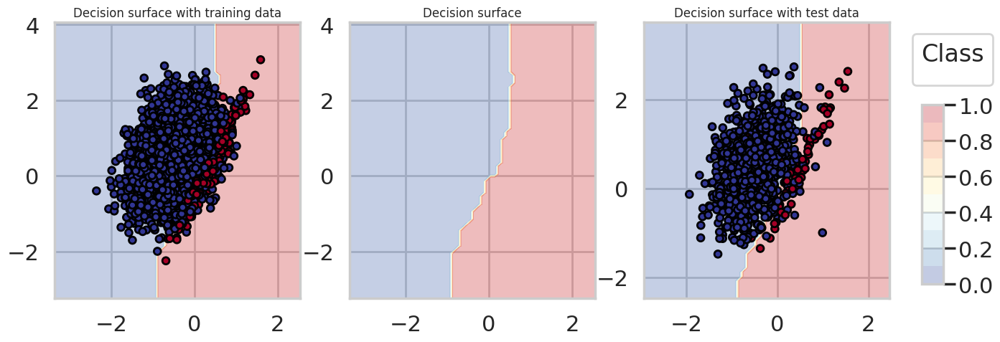

In [ ]:
classifier = imblearn.ensemble.BalancedBaggingClassifier(estimator=sklearn.tree.DecisionTreeClassifier(max_depth=5,random_state=0),
                                                         n_estimators=100,
                                                         sampling_strategy=1,
                                                         bootstrap=True,
                                                         sampler=imblearn.under_sampling.RandomUnderSampler(),
                                                         random_state=0)


(results_df_balanced_bagging, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                          X, y,
                                                                                          n_splits=5,
                                                                                          strategy_name="Balanced bagging")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

It is worth noting that the bottom right region is now associated with the minority class. This is due to the random undersampling, as was already observed in the previous section with a single decision tree.

**Random Forest**

A random forest is an ensemble of decision trees, where each tree is built using a random subset of the training data. The method is therefore closely related to bagging. The main difference lies in the building of the decision trees, where splitting is done using only a random subset of the features. This additional random variation has beneficial consequences. First, it usually leads to better predictive performances thanks to a higher diversity in the tree structures, lower overfitting, and higher robustness to noise and outliers. Second, it also speeds up the computation times since fewer features are considered in the construction of the trees.

🔹 First few rows of results DataFrame:
   fit_time  score_time                                          estimator  \
0  0.392038    0.024989  (DecisionTreeClassifier(max_depth=5, max_featu...   
1  0.397297    0.024878  (DecisionTreeClassifier(max_depth=5, max_featu...   
2  0.406720    0.024644  (DecisionTreeClassifier(max_depth=5, max_featu...   
3  0.384210    0.024814  (DecisionTreeClassifier(max_depth=5, max_featu...   
4  0.378045    0.024314  (DecisionTreeClassifier(max_depth=5, max_featu...   

   test_roc_auc  test_average_precision  test_balanced_accuracy  
0      0.930898                0.680124                0.699475  
1      0.932758                0.579160                0.660324  
2      0.957873                0.578349                0.678843  
3      0.929861                0.666138                0.681485  
4      0.914435                0.464128                0.640749  
Selected first trained classifier!
Train/Test DataFrames created successfully!
Function executio

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


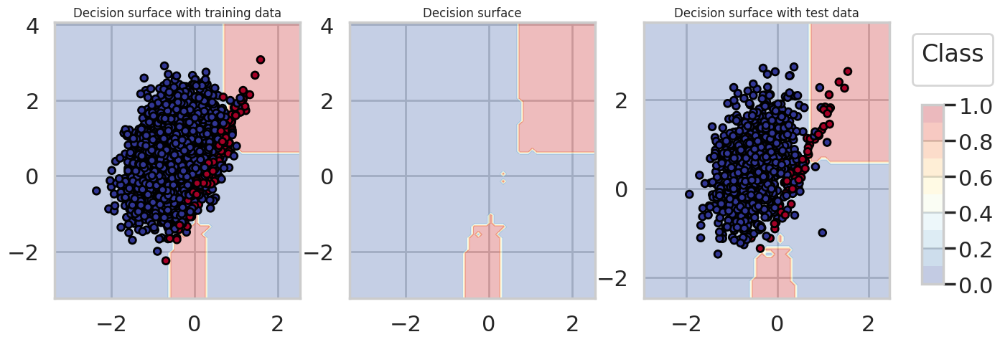

In [ ]:
classifier = sklearn.ensemble.RandomForestClassifier(n_estimators=100,
                                                     max_depth=5,
                                                     random_state=0)

(results_df_rf, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                            X, y,
                                                                            n_splits=5,
                                                                            strategy_name="Random forest")

fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

**Balanced Random Forest**

Balanced random forest was introduced in order to deal with imbalanced data. The procedure follows the same rationale as balanced bagging, and consists in building the baseline learners with balanced training sets.

The sampling_strategy parameter determines the imbalance ratio of the training sets used to build the decision trees. Let us train a balanced random forest classifier with 100 trees, a maximum depth of 5, and an imbalance ratio of 1, and assess its performances and decision boundary.

🔹 First few rows of results DataFrame:
   fit_time  score_time                                          estimator  \
0  0.463587    0.047439  (DecisionTreeClassifier(max_depth=5, max_featu...   
1  0.486924    0.036677  (DecisionTreeClassifier(max_depth=5, max_featu...   
2  0.491493    0.035165  (DecisionTreeClassifier(max_depth=5, max_featu...   
3  0.492200    0.036631  (DecisionTreeClassifier(max_depth=5, max_featu...   
4  0.438267    0.026491  (DecisionTreeClassifier(max_depth=5, max_featu...   

   test_roc_auc  test_average_precision  test_balanced_accuracy  
0      0.951854                0.651221                0.913261  
1      0.940001                0.591664                0.900830  
2      0.953851                0.560793                0.936555  
3      0.939286                0.631750                0.921737  
4      0.929195                0.494665                0.908249  
Selected first trained classifier!
Train/Test DataFrames created successfully!
Function executio

<ipython-input-25-2e30e6074986>:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[-1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), title="Class")


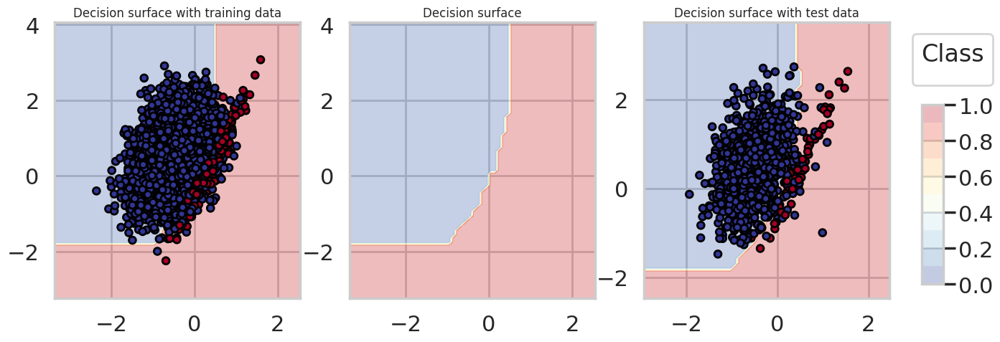

In [ ]:
classifier = imblearn.ensemble.BalancedRandomForestClassifier(n_estimators=100,
                                                              sampling_strategy=1,
                                                              max_depth=5,
                                                              random_state=0)

(results_df_rf_balanced, classifier_0, train_df, test_df) = kfold_cv_with_classifier(classifier,
                                                                                     X, y,
                                                                                     n_splits=5,
                                                                                     strategy_name="Balanced random forest")


fig_decision_boundary = plot_decision_boundary(classifier_0, train_df, test_df)

In [ ]:
pd.concat([results_df_bagging,
           results_df_balanced_bagging,
           results_df_rf,
           results_df_rf_balanced])

,Fit time (s),Score time (s),AUC ROC,Average Precision,Balanced accuracy
Bagging,0.632 +/- 0.014,0.048 +/- 0.002,0.943 +/- 0.01,0.597 +/- 0.07,0.748 +/- 0.041
Balanced bagging,0.434 +/- 0.008,0.103 +/- 0.006,0.947 +/- 0.009,0.586 +/- 0.058,0.92 +/- 0.013
Random forest,0.392 +/- 0.011,0.025 +/- 0.0,0.933 +/- 0.016,0.594 +/- 0.087,0.672 +/- 0.022
Balanced random forest,0.474 +/- 0.023,0.036 +/- 0.007,0.943 +/- 0.01,0.586 +/- 0.062,0.916 +/- 0.014


We note that the training procedure is faster than balanced bagging.

### Evaluation Metrics for Imbalanced Classification

---

In classification tasks, especially with class imbalance, conventional accuracy can be misleading.


Based on [*César Ferri et al. (2008)*](https://www.sciencedirect.com/science/article/abs/pii/S0167865508002687) and [*Imbalanced Learning (2013)*](https://onlinelibrary.wiley.com/doi/book/10.1002/9781118646106), metrics are divided into:

1. **Threshold Metrics** – Computed at a fixed decision threshold.
2. **Ranking Metrics** – Based on ranking rather than absolute predictions.
3. **Probability Metrics** – Evaluating probability calibration.

---

##### **Threshold-based Metrics**

- **Precision**: $ \frac{TP}{TP + FP} $
- **Recall**: $ \frac{TP}{TP + FN} $

*F-score* balances precision and recall:

$$F_{\beta} = (1 + \beta^2) \cdot \frac{\text{Precision} \times \text{Recall}}{(\beta^2 \times \text{Precision}) + \text{Recall}}$$

Where $\beta$ controls recall-precision trade-off.

-  $F_1^{\text{micro}} = 2 \cdot \frac{\sum TP}{2 \sum TP + \sum FP + \sum FN}$

-  $F_1^{\text{macro}} = \frac{1}{N} \sum_{i=1}^{N} F_1^i$

-  $F_1^{\text{weighted}} = \sum_{i=1}^{N} w_i \cdot F_1^i$

- G-Mean: $ \sqrt{\text{Recall} \times \text{Specificity}}$

---

##### **Ranking-based Metrics**

- AUC-ROC: $\int_0^1 \text{TPR}(FPR) \, d(\text{FPR})$
- AUC-PR: $\int_0^1 \text{Precision}(\text{Recall}) \, d(\text{Recall})$

---

##### **Probability-based Metrics**

- LogLoss: $-\frac{1}{N} \sum_{i=1}^{N} [y_i \log(p_i) + (1 - y_i) \log(1 - p_i)]$
- Brier Score: $\frac{1}{N} \sum_{i=1}^{N} (p_i - y_i)^2$

---

### **Choosing the Right Metric**

| **Scenario**               | **Recommended Metric**           |
|----------------------------|----------------------------------|
| General Performance        | F1-Score, MCC, G-Mean            |
| Severe Imbalance           | AUC-PR, G-Mean, MCC              |
| Ranked Predictions         | AUC-ROC, AUC-PR                  |
| Probability Calibration    | LogLoss, Brier Score             |
| When False Negatives Matter| Recall, F1-Score                 |
| When False Positives Matter| Precision, F1-Score              |

---



We will see how to choose metrics using very simple example:)

In [ ]:
data = {
    'No': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'Actual': ['Airplane', 'Car', 'Car', 'Car', 'Car', 'Airplane', 'Boat', 'Car', 'Airplane', 'Car'],
    'Predicted': ['Airplane', 'Boat', 'Car', 'Car', 'Boat', 'Boat', 'Boat', 'Airplane', 'Airplane', 'Car']
}

df = pd.DataFrame(data)

# Calculate classification metrics
y_true = df['Actual']
y_pred = df['Predicted']

report = classification_report(y_true, y_pred, target_names=['Airplane', 'Boat', 'Car'])

print(report)


              precision    recall  f1-score   support

    Airplane       0.67      0.67      0.67         3
        Boat       0.25      1.00      0.40         1
         Car       1.00      0.50      0.67         6

    accuracy                           0.60        10
   macro avg       0.64      0.72      0.58        10
weighted avg       0.82      0.60      0.64        10



In [ ]:
# Compute confusion matrix
labels = ['Airplane', 'Boat', 'Car']
cm = confusion_matrix(y_true, y_pred, labels=labels)

confusion_df = pd.DataFrame(cm, index=labels, columns=labels)
print("Confusion Matrix:\n", confusion_df)

TP = np.diag(cm)
FP = np.sum(cm, axis=0) - TP
FN = np.sum(cm, axis=1) - TP

metrics_df = pd.DataFrame({
    'Label': labels,
    'True Positive (TP)': TP,
    'False Positive (FP)': FP,
    'False Negative (FN)': FN
})

print("\nTP, FP, FN Table:\n", metrics_df)

Confusion Matrix:
           Airplane  Boat  Car
Airplane         2     1    0
Boat             0     1    0
Car              1     2    3

TP, FP, FN Table:
       Label  True Positive (TP)  False Positive (FP)  False Negative (FN)
0  Airplane                   2                    1                    1
1      Boat                   1                    3                    0
2       Car                   3                    0                    3


*  How will we calculate F1 score?

<img src="https://towardsdatascience.com/wp-content/uploads/2022/01/11TGTF8chlODIBMIvU6xUUg-1024x330.png" width="600">

However, instead of having multiple per-class F1 scores, it would be better to average them to obtain a single number to describe overall performance.

* Macro F1

<img src="https://towardsdatascience.com/wp-content/uploads/2022/01/1vLFtzVb2MaFcs2cECuTO5Q-1024x402.png" width="500">

The macro-averaged F1 score (or macro F1 score) is computed using the arithmetic mean (aka unweighted mean) of all the per-class F1 scores.

* Weighted average F1


<img src="https://towardsdatascience.com/wp-content/uploads/2022/01/10SN1NHpAz154YOjgBLCCYw-1024x393.png" width="500">


The weighted-averaged F1 score is calculated by taking the mean of all per-class F1 scores while considering each class’s support.

* Micro F1

Micro averaging computes a global average F1 score by counting the sums of the True Positives (TP), False Negatives (FN), and False Positives (FP).

<img src="https://towardsdatascience.com/wp-content/uploads/2022/01/1J6HcY0tM8zL9N0tpTg4NlA-1024x369.png" width="500">

**How to choose?**

* If you are working with an imbalanced dataset where all classes are equally important, using the **macro average** would be a good choice as it treats all classes equally

*  If you have an imbalanced dataset but want to assign greater contribution to classes with more examples in the dataset, then the **weighted average** is preferred.

*   Suppose you have a balanced dataset and want an easily understandable metric for overall performance regardless of the class. In that case, you can go with accuracy, which is essentially our **micro F1 score**.

<img src="https://machinelearningmastery.com/wp-content/uploads/2019/12/How-to-Choose-a-Metric-for-Imbalanced-Classification-latest.png" width="800">

**Conclusion:**

Today we studied:
- Multiclass classifiction with: Logistic Regresion (multinomial) and Decision Tree.
- Two strategies OvR and OvO
- Imbalanced data problem
- Techniques to solve imbalanced data: data-level, algorithm level and hybrid
- Metrcis for imbalanced data

If you have any questions, you could write me: @huanpops

**References**

- [Theory of softmax Regression](http://ufldl.stanford.edu/tutorial/supervised/SoftmaxRegression/)

- [Good article about LogReg for multiclass on Medium](https://medium.com/@jjw92abhi/is-logistic-regression-a-good-multi-class-classifier-ad20fecf1309)

- [Multiclass with Logistic regression in python](https://machinelearningmastery.com/multinomial-logistic-regression-with-python/)

- [Good blog about OvR and OvO](https://github.com/christianversloot/machine-learning-articles/blob/main/creating-one-vs-rest-and-one-vs-one-svm-classifiers-with-scikit-learn.md)

- Sun, Y., Wong, A. K., & Kamel, M. S. (2009). Classification of imbalanced data: A review. International journal of pattern recognition and artificial intelligence, 23(04), 687-719.

- Le Borgne, Yann-Aël, Siblini, Wissam, Lebichot, Bertrand, & Bontempi, Gianluca. (2022). *Reproducible Machine Learning for Credit Card Fraud Detection - Practical Handbook*. [GitHub Repository](https://github.com/Fraud-Detection-Handbook/fraud-detection-handbook).


- [Imbalanced data (blog on russian)](https://alexanderdyakonov.wordpress.com/2021/05/27/imbalance/)

- [Example with calculations of F1 scores](https://towardsdatascience.com/micro-macro-weighted-averages-of-f1-score-clearly-explained-b603420b292f/)